<a href="https://colab.research.google.com/github/Akshidha-Unni/Osteoporosis-Image-Classification-using-SAM-and-Transfer-Learning/blob/main/SAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Implementation of Region-of-Interest Extraction with [Segment Anything Model (SAM)](https://segment-anything.com/) from Meta.ai

This notebook contains images from a dataset provided by [Mendeley Data](https://data.mendeley.com/datasets/fxjm8fb6mw/2) and can be cited as:

Majeed Wani, Insha ; Arora, Sakshi (2021), “Knee X-ray Osteoporosis Database”, Mendeley Data, V2, doi: 10.17632/fxjm8fb6mw.2

The notebook is structured as follows:

1. Loading the SAM model
2. Importing an image
3. Segmenting it
4. Creating segmentation masks
5. Manually choosing regions of interest
6. Extracting regions of interest
7. Saving these regions as .png

Since have never implemented SAM, the following tutorial was used for source code for SAM implementation:

Collab Notebook: https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/how-to-segment-anything-with-sam.ipynb#scrollTo=U2opSwP1Np7s


Additionally, there is a video tutorial which we followed:

Tutorial:
https://www.youtube.com/watch?v=D-D6ZmadzPE

In [ ]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings(action="ignore")
import cv2
from PIL import Image
import supervision as sv

In [ ]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


In [ ]:
!pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'

  Preparing metadata (setup.py) ... done


In [ ]:
!pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision==0.23.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.5/151.5 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.7/213.7 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.5/49.5 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 727.4/727.4 kB 27.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 57.4 MB/s eta 0:00:00


In [ ]:
!mkdir -p {HOME}/weights
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -P {HOME}/weights

In [ ]:
import os

CHECKPOINT_PATH = os.path.join(HOME, "weights", "sam_vit_h_4b8939.pth")
print(CHECKPOINT_PATH, "; exist:", os.path.isfile(CHECKPOINT_PATH))

/content/weights/sam_vit_h_4b8939.pth ; exist: True


In [ ]:
import torch

DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
MODEL_TYPE = "vit_h"

In [ ]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH).to(device=DEVICE)

In [ ]:
mask_generator = SamAutomaticMaskGenerator(sam)

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS1.JPEG"

In [ ]:
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
image.shape

(1024, 1024, 3)

In [ ]:
sam_result = mask_generator.generate(image)

In [ ]:
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


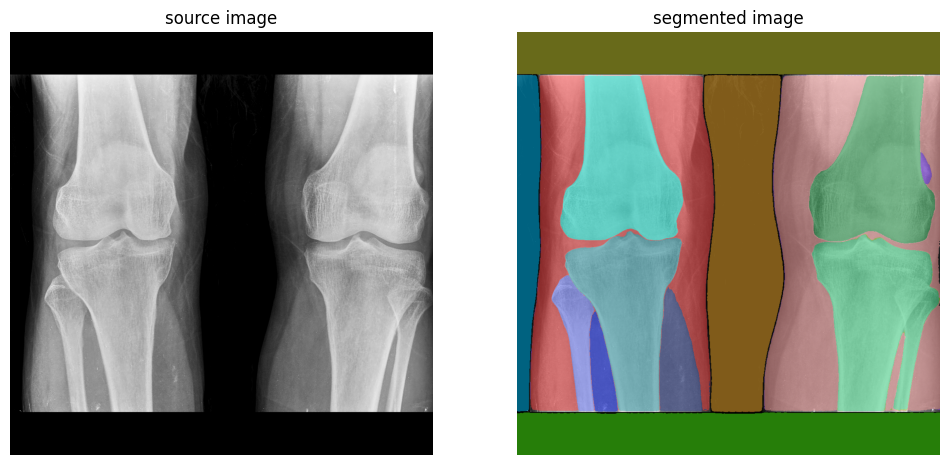

In [ ]:
import supervision as sv
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

In [ ]:
len(masks)

17

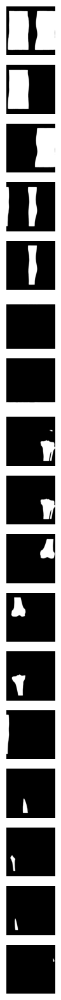

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(17, int(len(masks) / 17)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)

Code to convert a mask to have 0-255 representation. This will help in extracting the regions of interest: https://stackoverflow.com/questions/76870102/how-to-save-segmented-images-or-masks-using-segment-anything-model-sam

In [ ]:
masks = (masks * 255).astype(np.uint8)  # Convert to uint8 format

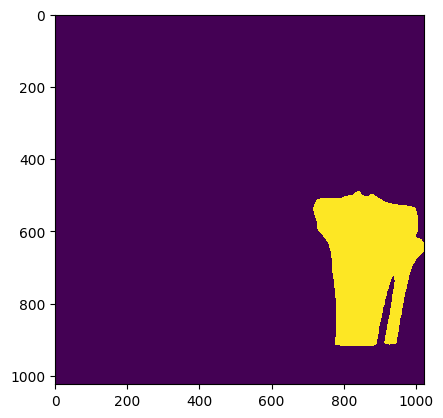

In [ ]:
plt.imshow(masks[8], interpolation='nearest')
plt.show()

Ensuring the original image and the mask are of the same data type.

In [ ]:
image.dtype

dtype('uint8')

In [ ]:
masks.dtype

dtype('uint8')

To extract region of interest, we looked at the code written by others on StackOverflow. The first result was the approach we took. The code was adapted from Matlab to Python.

Code: https://stackoverflow.com/questions/26876290/how-to-extract-region-of-interest-with-binary-mask

Code: https://stackoverflow.com/questions/67650128/efficient-way-to-get-roi-from-original-image-using-contours-found-in-mask

In [ ]:
im = masks[8]/255
im

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
im = im.astype(int)

In [ ]:
import cv2

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG = image * ROI

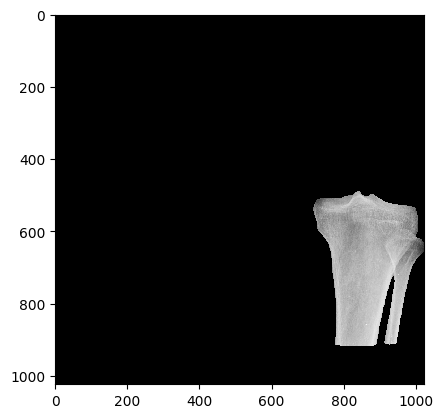

In [ ]:
plt.imshow(SEG, interpolation='nearest')
plt.show()

We successfully extracted the first region of interest.

In [ ]:
save_path = "/content/drive/My Drive/ROI2/Osteoporosis/"

In [ ]:
cv2.imwrite(save_path + "1.jpeg", SEG)

True

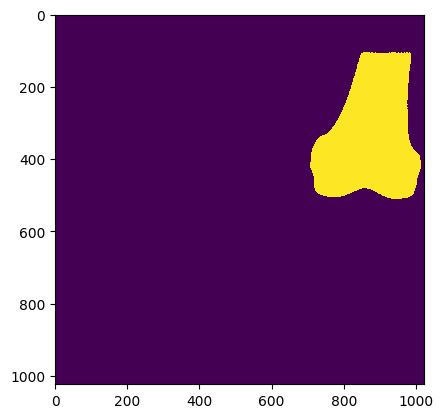

In [ ]:
plt.imshow(masks[9], interpolation='nearest')
plt.show()

In [ ]:
im = masks[9]/255
im
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG2 = image * ROI

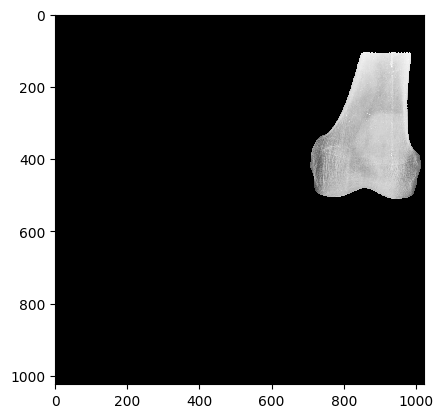

In [ ]:
plt.imshow(SEG2, interpolation='nearest')
plt.show()

In [ ]:
cv2.imwrite(save_path + "2.jpeg", SEG2)

True

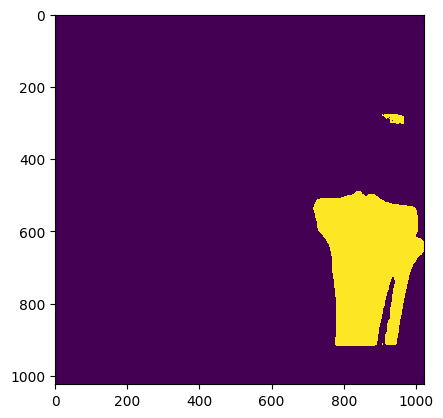

In [ ]:
plt.imshow(masks[7], interpolation='nearest')
plt.show()

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG3 = image * ROI

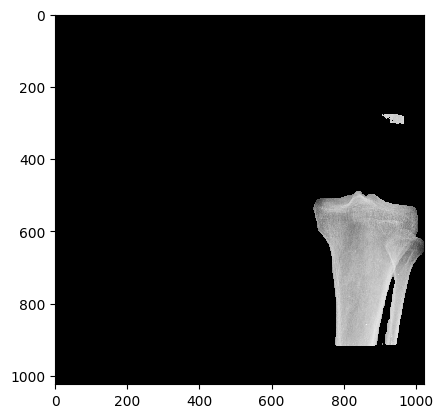

In [ ]:
plt.imshow(SEG3, interpolation='nearest')
plt.show()

In [ ]:
cv2.imwrite(save_path + "3.jpeg", SEG3)

True

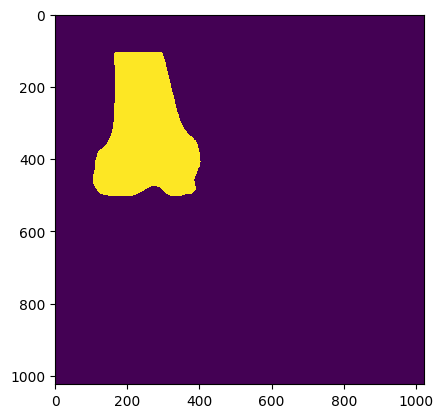

In [ ]:
plt.imshow(masks[10], interpolation='nearest')
plt.show()

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG4 = image * ROI

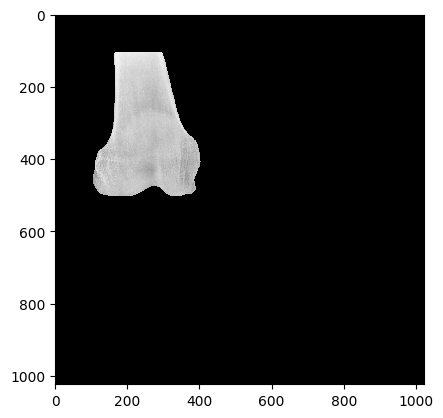

In [ ]:
plt.imshow(SEG4, interpolation='nearest')
plt.show()

In [ ]:
cv2.imwrite(save_path + "4.jpeg", SEG4)

True

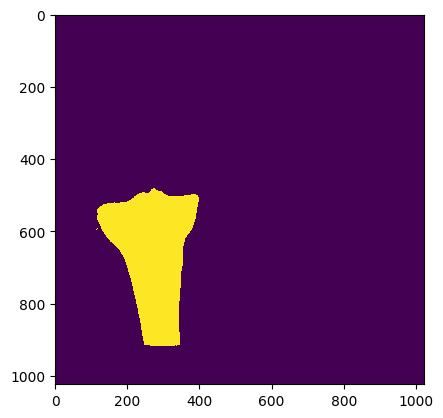

In [ ]:
plt.imshow(masks[11], interpolation='nearest')
plt.show()

In [ ]:
im = masks[11]/255
im
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG5 = image * ROI

In [ ]:
cv2.imwrite(save_path + "4.jpeg", SEG4)

True

It would be easier to create a function to automate the codes, however, because we need to manually choose masks, it is not very feasible to create a function. We will simply rerun the code with each new image.

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS2.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


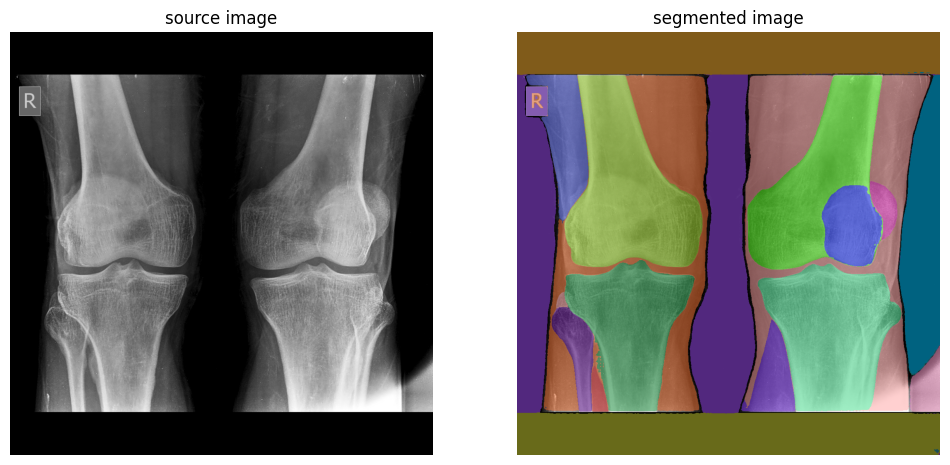

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

25

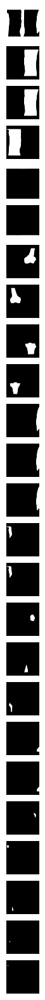

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(25, int(len(masks) / 25)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

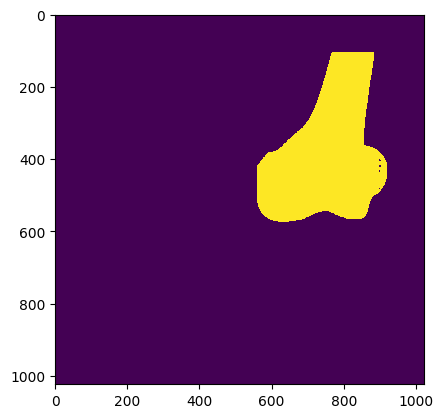

In [ ]:
plt.imshow(masks[6], interpolation='nearest')
plt.show()

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG5 = image * ROI

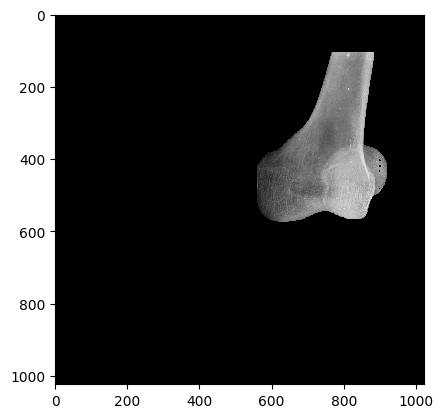

In [ ]:
plt.imshow(SEG5, interpolation='nearest')
plt.show()

In [ ]:
cv2.imwrite(save_path + "5.jpeg", SEG10)

True

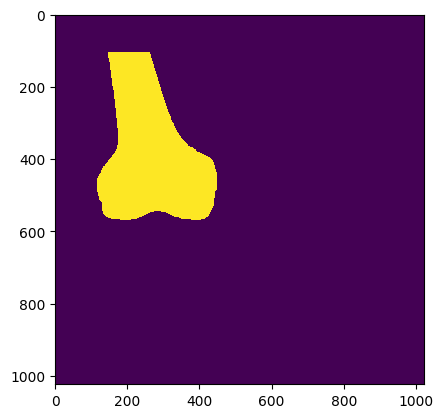

In [ ]:
plt.imshow(masks[7], interpolation='nearest')
plt.show()

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG6 = image * ROI

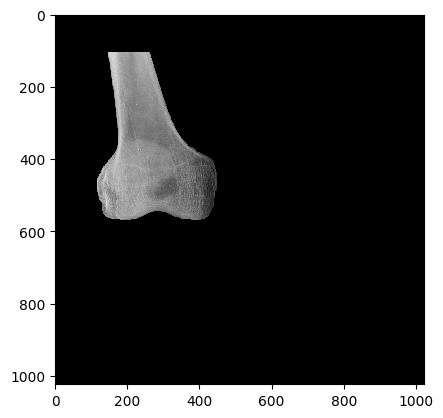

In [ ]:
plt.imshow(SEG6, interpolation='nearest')
plt.show()

In [ ]:
cv2.imwrite(save_path + "6.jpeg", SEG6)

True

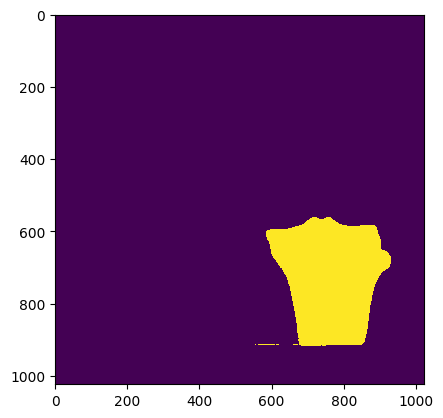

In [ ]:
plt.imshow(masks[8], interpolation='nearest')
plt.show()

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG7 = image * ROI

In [ ]:
cv2.imwrite(save_path + "7.jpeg", SEG7)

True

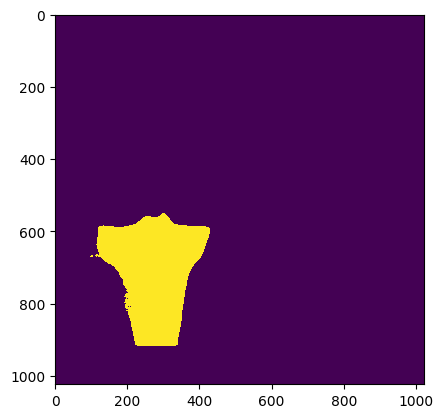

In [ ]:
plt.imshow(masks[9], interpolation='nearest')
plt.show()

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG8 = image * ROI

In [ ]:
cv2.imwrite(save_path + "8.jpeg", SEG8)

True

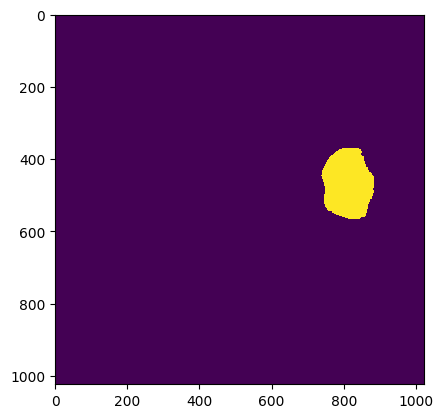

In [ ]:
plt.imshow(masks[15], interpolation='nearest')
plt.show()

In [ ]:
im = masks[15]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG9 = image * ROI

In [ ]:
cv2.imwrite(save_path + "9.jpeg", SEG9)

True

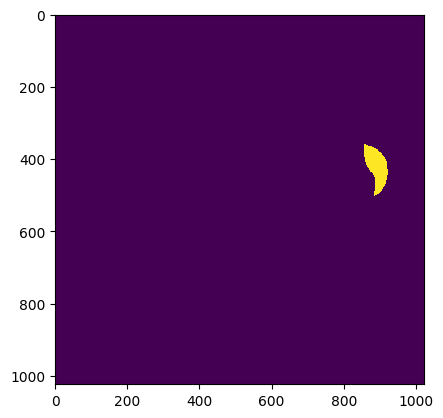

In [ ]:
plt.imshow(masks[20], interpolation='nearest')
plt.show()

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS3.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


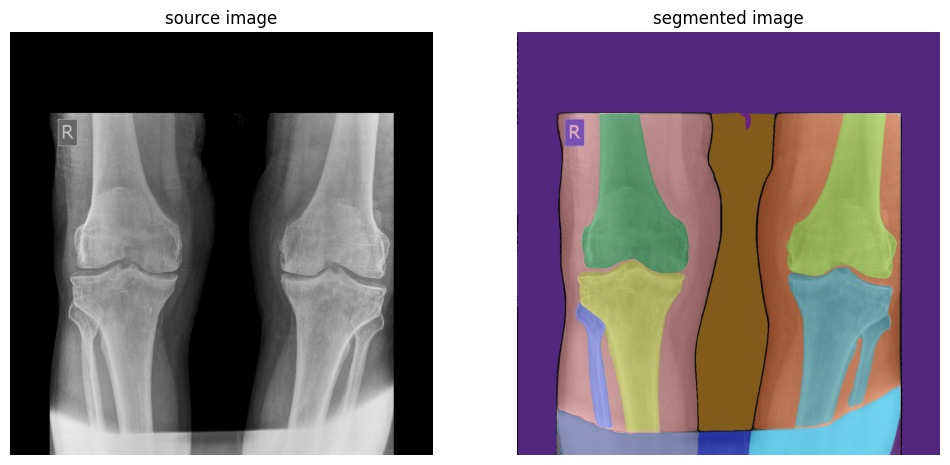

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

20

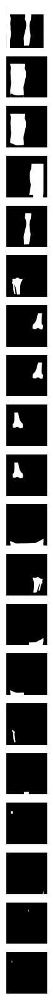

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(20, int(len(masks) / 20)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

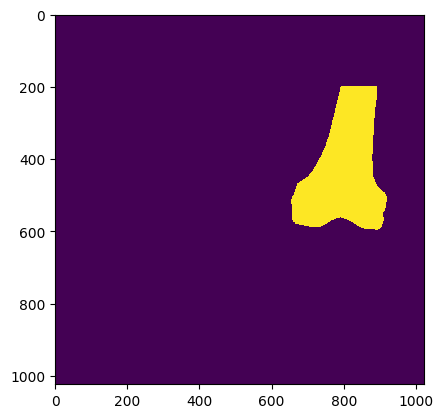

In [ ]:
plt.imshow(masks[6], interpolation='nearest')
plt.show()

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG10 = image * ROI

In [ ]:
cv2.imwrite(save_path + "10.jpeg", SEG10)

True

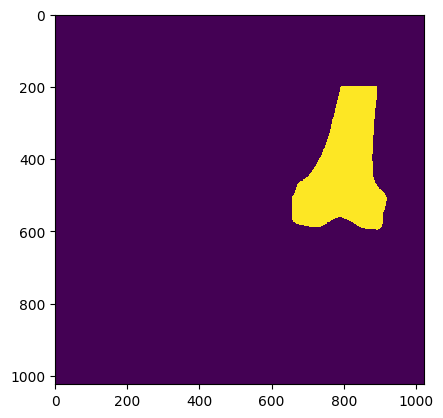

In [ ]:
plt.imshow(masks[7], interpolation='nearest')
plt.show()

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG11 = image * ROI

In [ ]:
cv2.imwrite(save_path + "11.jpeg", SEG11)

True

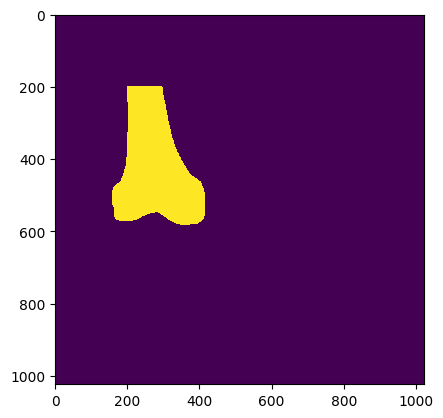

In [ ]:
plt.imshow(masks[8], interpolation='nearest')
plt.show()

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG12 = image * ROI

In [ ]:
cv2.imwrite(save_path + "12.jpeg", SEG12)

True

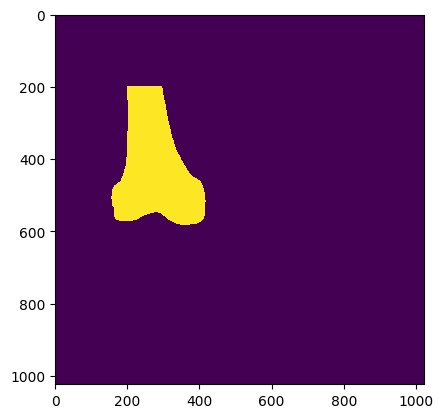

In [ ]:
plt.imshow(masks[9], interpolation='nearest')
plt.show()

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG12 = image * ROI

In [ ]:
cv2.imwrite(save_path + "12.jpeg", SEG12)

True

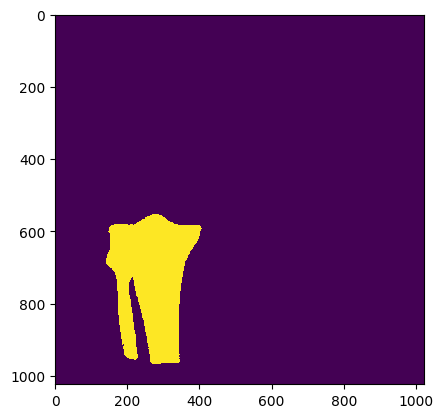

In [ ]:
plt.imshow(masks[5], interpolation='nearest')
plt.show()

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG13 = image * ROI

In [ ]:
cv2.imwrite(save_path + "13.jpeg", SEG13)

True

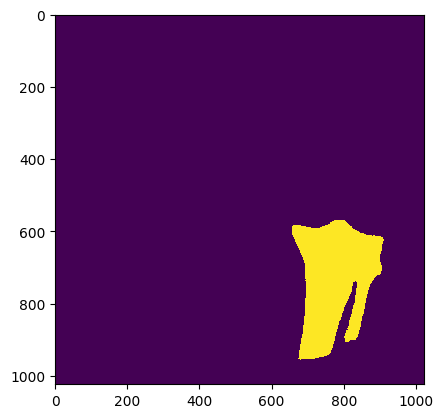

In [ ]:
plt.imshow(masks[11], interpolation='nearest')
plt.show()

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG14 = image * ROI

In [ ]:
cv2.imwrite(save_path + "14.jpeg", SEG14)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS4.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


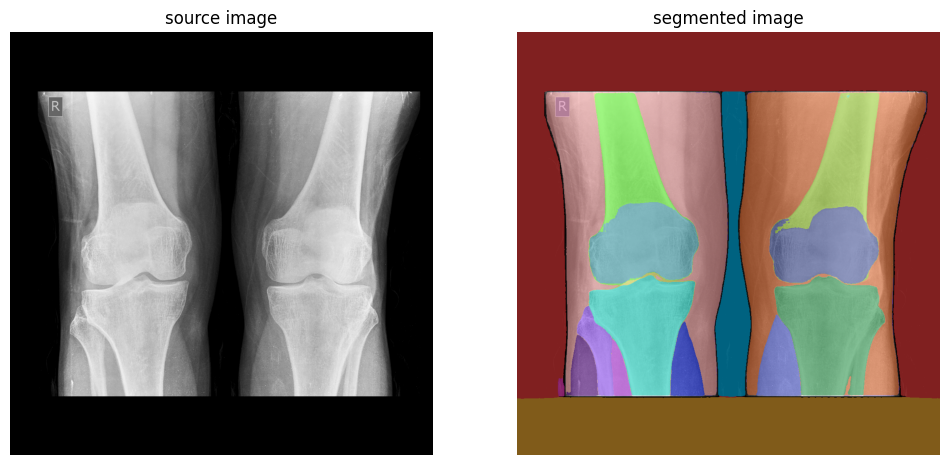

In [ ]:
import supervision as sv
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

21

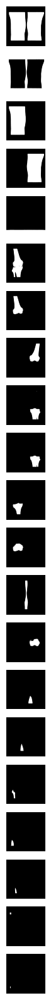

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(21, int(len(masks) / 21)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG15 = image * ROI
cv2.imwrite(save_path + "15.jpeg", SEG15)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG16 = image * ROI
cv2.imwrite(save_path + "16.jpeg", SEG16)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG17 = image * ROI
cv2.imwrite(save_path + "17.jpeg", SEG17)


True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG18 = image * ROI
cv2.imwrite(save_path + "18.jpeg", SEG18)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG19 = image * ROI
cv2.imwrite(save_path + "19.jpeg", SEG19)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG20 = image * ROI
cv2.imwrite(save_path + "20.jpeg", SEG20)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG21 = image * ROI
cv2.imwrite(save_path + "21.jpeg", SEG21)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG22 = image * ROI
cv2.imwrite(save_path + "22.jpeg", SEG22)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG23 = image * ROI
cv2.imwrite(save_path + "23.jpeg", SEG23)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS5.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


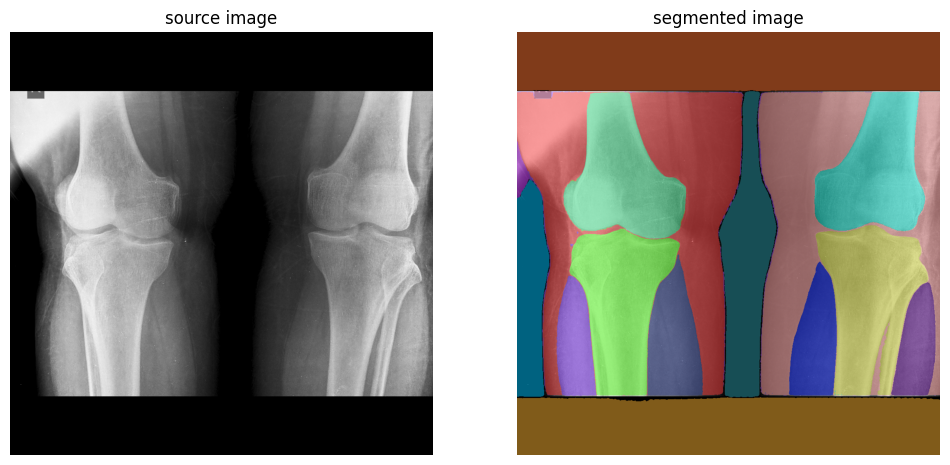

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

20

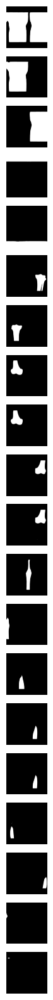

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(20, int(len(masks) / 20)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG24 = image * ROI
cv2.imwrite(save_path + "24.jpeg", SEG24)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG25 = image * ROI
cv2.imwrite(save_path + "25.jpeg", SEG25)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG26 = image * ROI
cv2.imwrite(save_path + "26.jpeg", SEG26)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG27 = image * ROI
cv2.imwrite(save_path + "27.jpeg", SEG27)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG28 = image * ROI
cv2.imwrite(save_path + "28.jpeg", SEG28)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS6.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


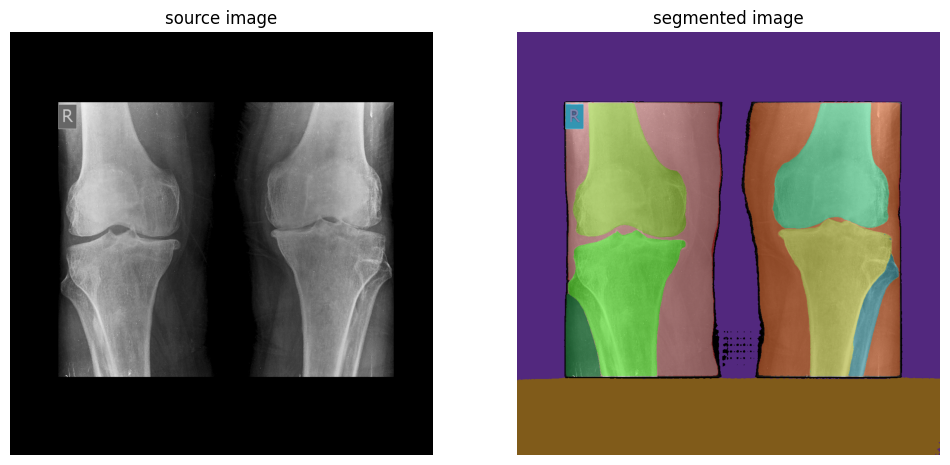

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

14

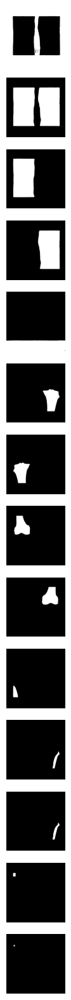

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(14, int(len(masks) / 14)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG29 = image * ROI
cv2.imwrite(save_path + "29.jpeg", SEG29)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG30 = image * ROI
cv2.imwrite(save_path + "30.jpeg", SEG30)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG31 = image * ROI
cv2.imwrite(save_path + "31.jpeg", SEG31)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS7.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


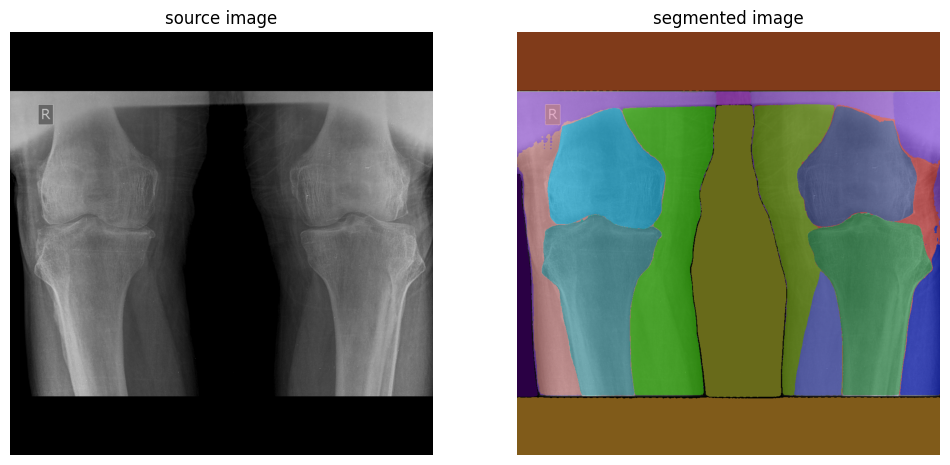

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

20

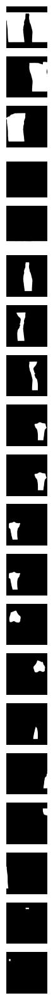

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(20, int(len(masks) / 20)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG32 = image * ROI
cv2.imwrite(save_path + "32.jpeg", SEG32)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG33 = image * ROI
cv2.imwrite(save_path + "33.jpeg", SEG33)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG34 = image * ROI
cv2.imwrite(save_path + "34.jpeg", SEG34)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG35 = image * ROI
cv2.imwrite(save_path + "35.jpeg", SEG35)

True

In [ ]:
im = masks[13]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG36 = image * ROI
cv2.imwrite(save_path + "36.jpeg", SEG36)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS8.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


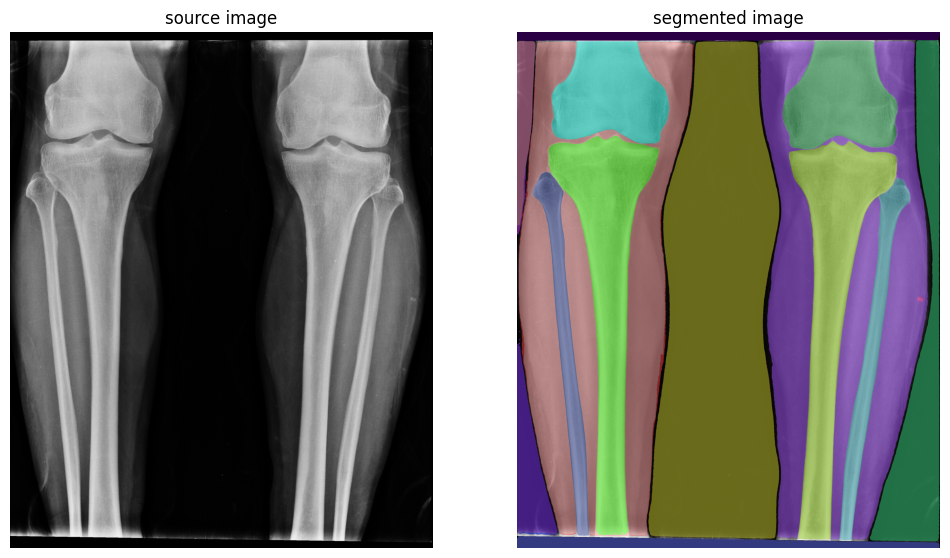

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

21

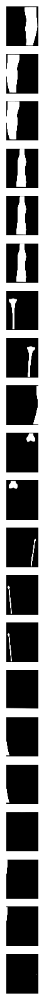

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(21, int(len(masks) / 21)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG37 = image * ROI
cv2.imwrite(save_path + "37.jpeg", SEG37)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG38 = image * ROI
cv2.imwrite(save_path + "38.jpeg", SEG38)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG39 = image * ROI
cv2.imwrite(save_path + "39.jpeg", SEG39)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG40 = image * ROI
cv2.imwrite(save_path + "40.jpeg", SEG40)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS10.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


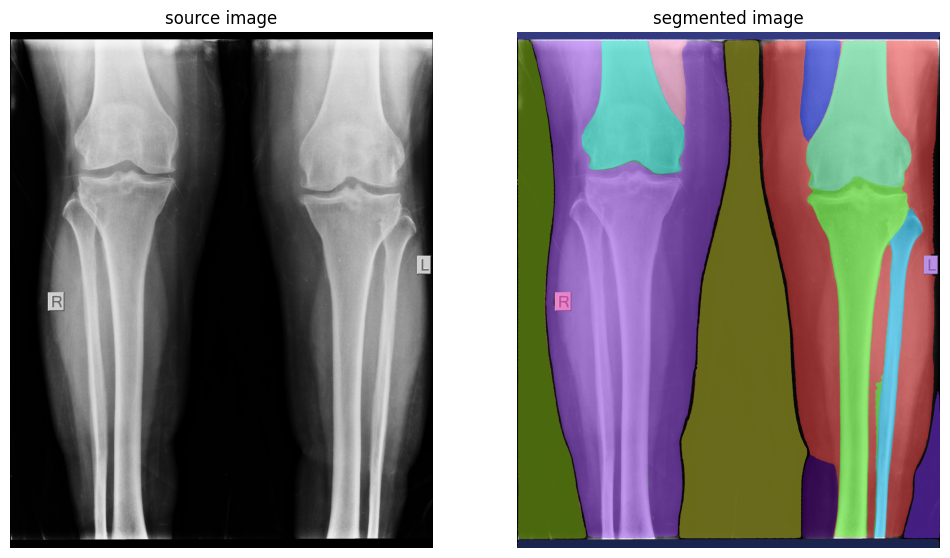

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

22

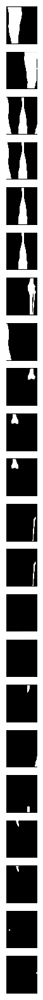

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(22, int(len(masks) / 22)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG41 = image * ROI
cv2.imwrite(save_path + "41.jpeg", SEG41)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG42 = image * ROI
cv2.imwrite(save_path + "42.jpeg", SEG42)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG43 = image * ROI
cv2.imwrite(save_path + "43.jpeg", SEG43)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG44 = image * ROI
cv2.imwrite(save_path + "44.jpeg", SEG44)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG45 = image * ROI
cv2.imwrite(save_path + "45.jpeg", SEG45)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG46 = image * ROI
cv2.imwrite(save_path + "46.jpeg", SEG46)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS11.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


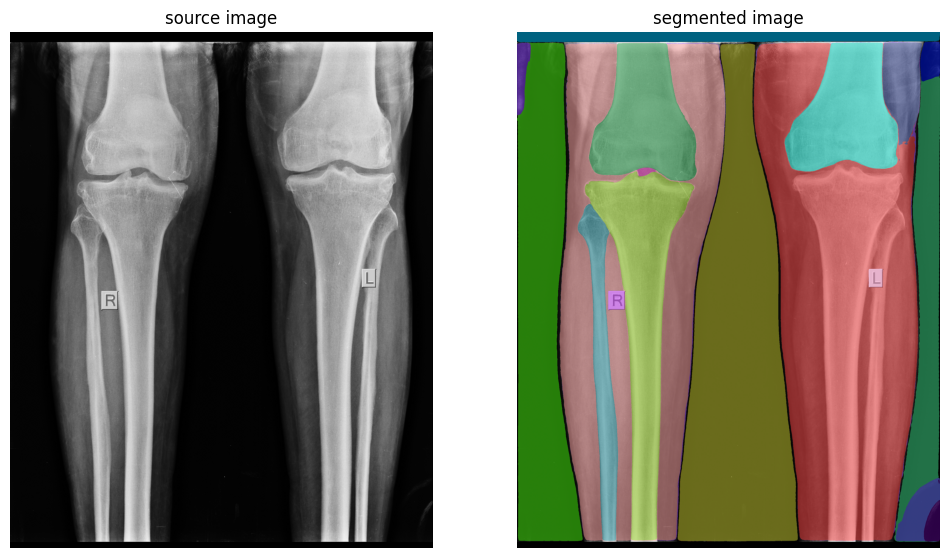

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

21

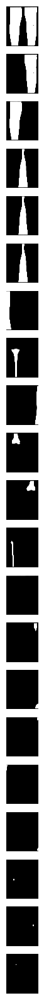

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(21, int(len(masks) / 21)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG47 = image * ROI
cv2.imwrite(save_path + "47.jpeg", SEG47)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG48 = image * ROI
cv2.imwrite(save_path + "48.jpeg", SEG48)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG48 = image * ROI
cv2.imwrite(save_path + "48.jpeg", SEG48)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG49 = image * ROI
cv2.imwrite(save_path + "49.jpeg", SEG49)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS12.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


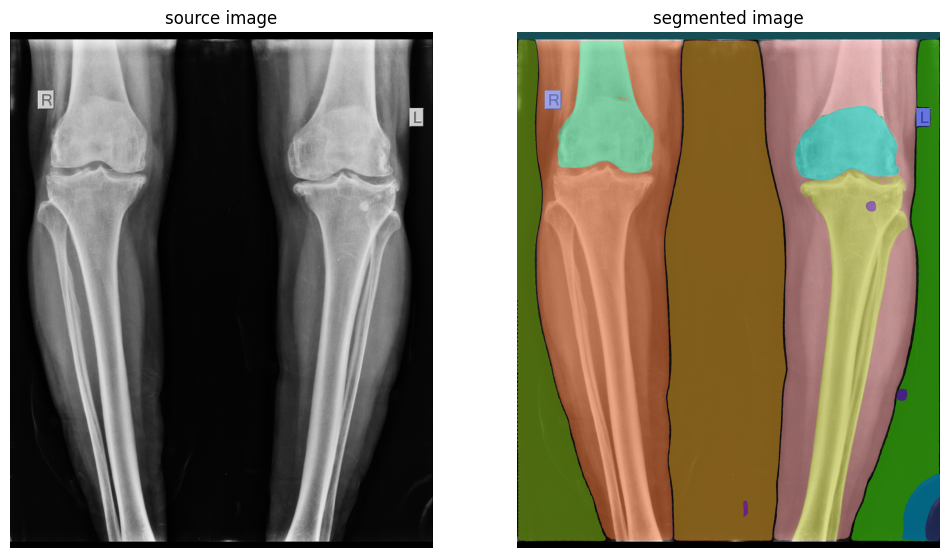

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

19

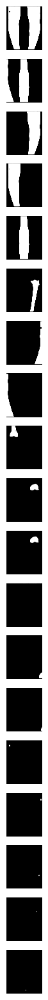

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(19, int(len(masks) / 19)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG50 = image * ROI
cv2.imwrite(save_path + "50.jpeg", SEG50)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG51 = image * ROI
cv2.imwrite(save_path + "51.jpeg", SEG51)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG52 = image * ROI
cv2.imwrite(save_path + "52.jpeg", SEG52)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG53 = image * ROI
cv2.imwrite(save_path + "53.jpeg", SEG53)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS13.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


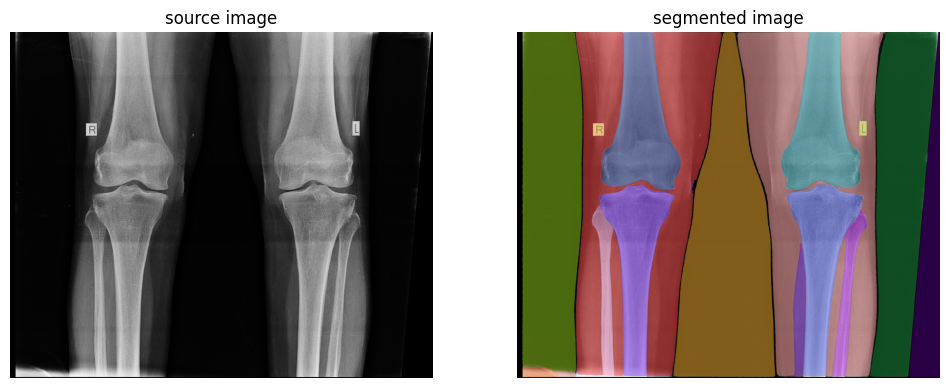

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

27

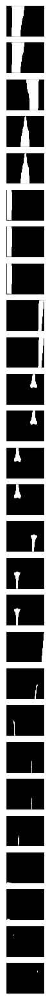

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(27, int(len(masks) / 27)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG54 = image * ROI
cv2.imwrite(save_path + "54.jpeg", SEG54)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG55 = image * ROI
cv2.imwrite(save_path + "55.jpeg", SEG55)

True

In [ ]:
im = masks[13]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG56 = image * ROI
cv2.imwrite(save_path + "56.jpeg", SEG56)

True

In [ ]:
im = masks[14]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG57 = image * ROI
cv2.imwrite(save_path + "57.jpeg", SEG57)

True

In [ ]:
im = masks[15]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG58 = image * ROI
cv2.imwrite(save_path + "58.jpeg", SEG58)

True

In [ ]:
im = masks[16]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG59 = image * ROI
cv2.imwrite(save_path + "59.jpeg", SEG59)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS14.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


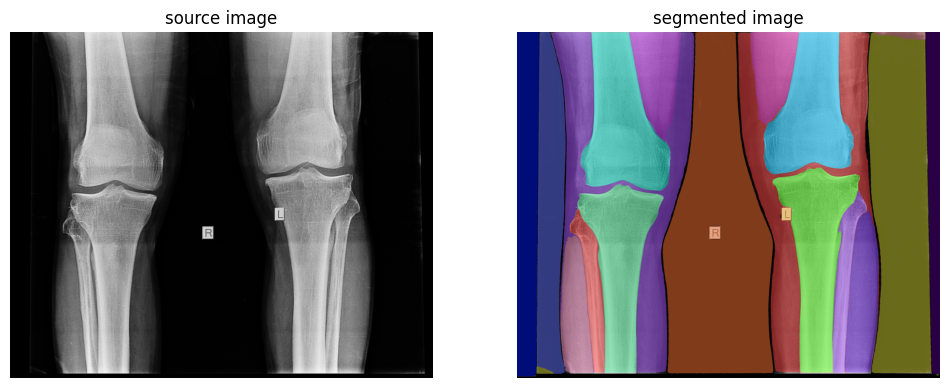

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

27

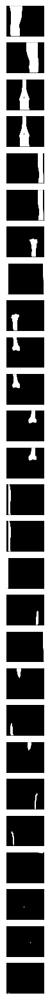

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(27, int(len(masks) / 27)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG60 = image * ROI
cv2.imwrite(save_path + "60.jpeg", SEG60)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG62 = image * ROI
cv2.imwrite(save_path + "62.jpeg", SEG62)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS15.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


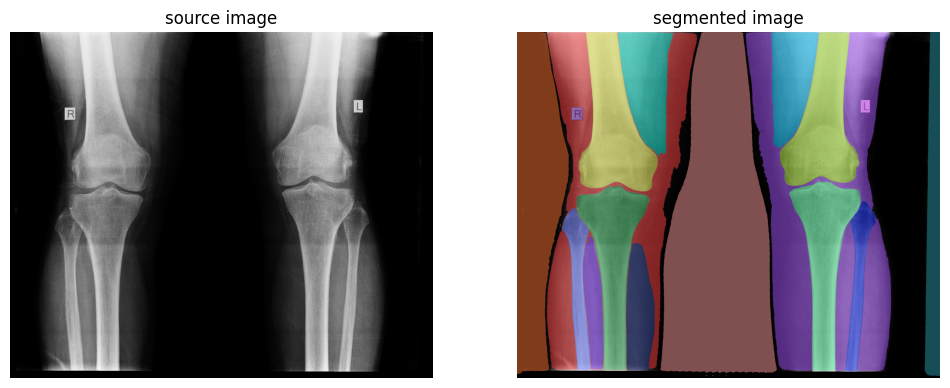

In [ ]:
import supervision as sv
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

19

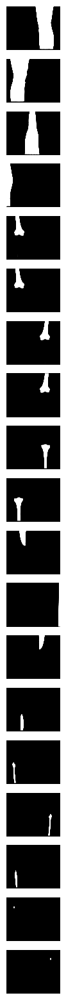

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(19, int(len(masks) / 19)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[4]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG63 = image * ROI
cv2.imwrite(save_path + "63.jpeg", SEG63)

True

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG64 = image * ROI
cv2.imwrite(save_path + "64.jpeg", SEG64)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG65 = image * ROI
cv2.imwrite(save_path + "65.jpeg", SEG65)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG66 = image * ROI
cv2.imwrite(save_path + "66.jpeg", SEG66)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG67 = image * ROI
cv2.imwrite(save_path + "67.jpeg", SEG67)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG68 = image * ROI
cv2.imwrite(save_path + "68.jpeg", SEG68)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS16.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


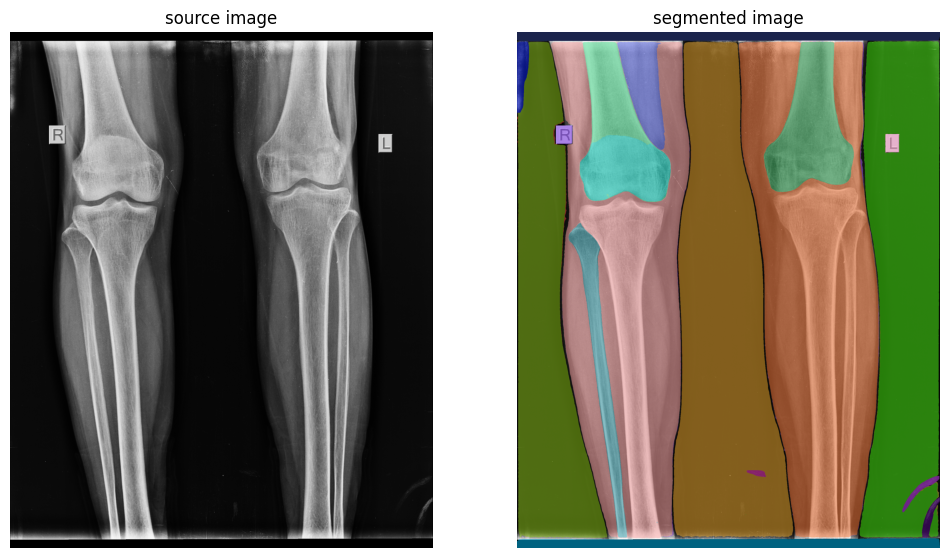

In [ ]:
import supervision as sv
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

21

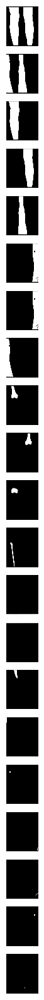

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(21, int(len(masks) / 21)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG69 = image * ROI
cv2.imwrite(save_path + "69.jpeg", SEG69)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG70 = image * ROI
cv2.imwrite(save_path + "70.jpeg", SEG70)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG71 = image * ROI
cv2.imwrite(save_path + "71.jpeg", SEG71)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS17.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


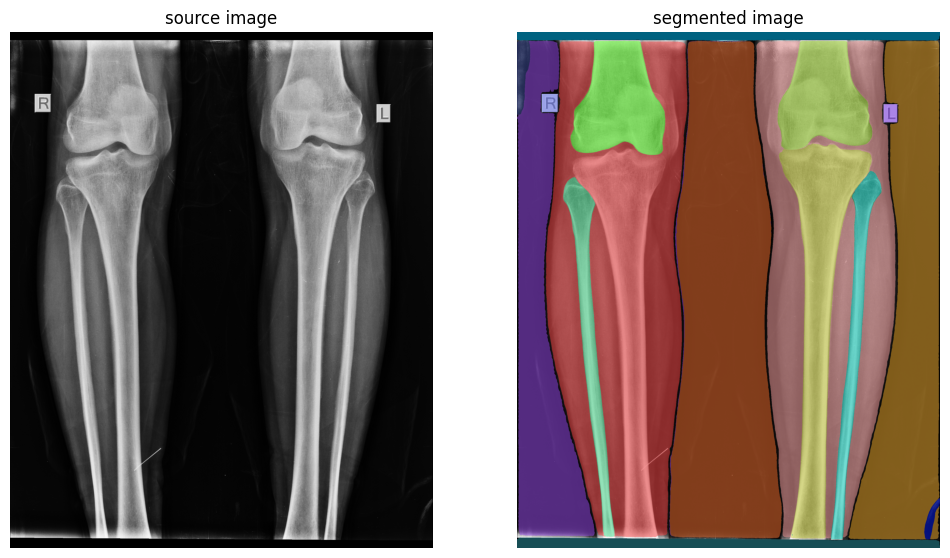

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

17

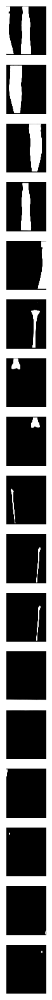

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(17, int(len(masks) / 17)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG72 = image * ROI
cv2.imwrite(save_path + "72.jpeg", SEG72)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG73 = image * ROI
cv2.imwrite(save_path + "73.jpeg", SEG73)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG74 = image * ROI
cv2.imwrite(save_path + "74.jpeg", SEG74)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS18.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


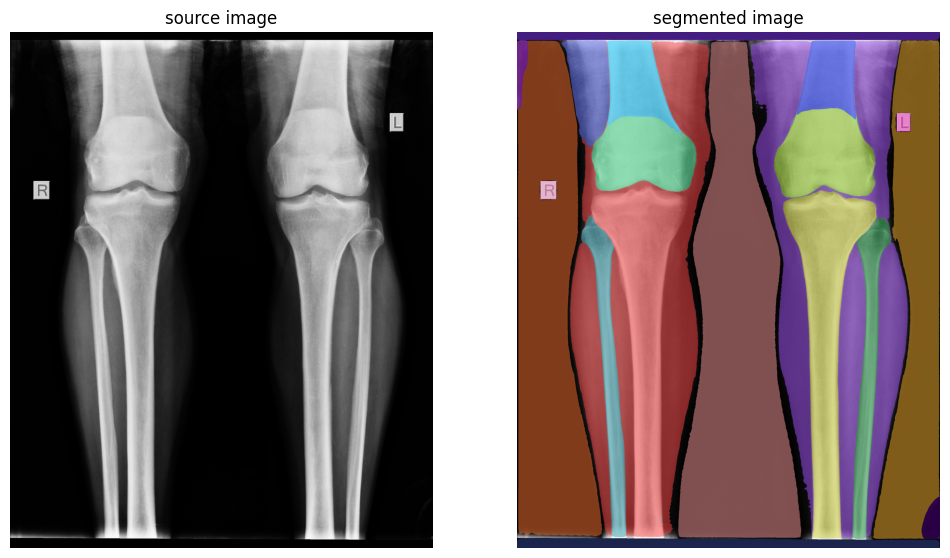

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

21

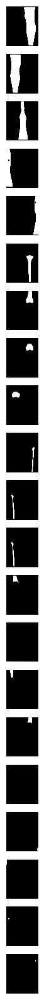

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(21, int(len(masks) / 21)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG75 = image * ROI
cv2.imwrite(save_path + "75.jpeg", SEG75)

True

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG76 = image * ROI
cv2.imwrite(save_path + "76.jpeg", SEG76)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG77 = image * ROI
cv2.imwrite(save_path + "77.jpeg", SEG77)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG78 = image * ROI
cv2.imwrite(save_path + "78.jpeg", SEG78)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS19.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


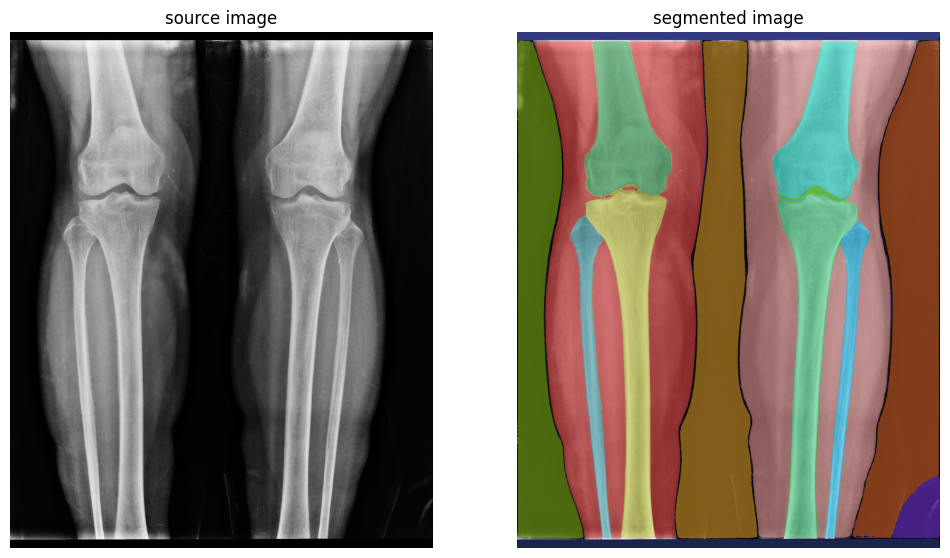

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

17

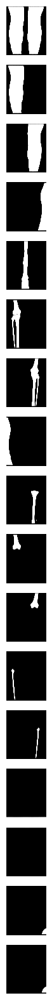

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(17, int(len(masks) / 17)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG79 = image * ROI
cv2.imwrite(save_path + "79.jpeg", SEG79)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG80 = image * ROI
cv2.imwrite(save_path + "80.jpeg", SEG80)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG81 = image * ROI
cv2.imwrite(save_path + "81.jpeg", SEG81)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG82 = image * ROI
cv2.imwrite(save_path + "82.jpeg", SEG82)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG83 = image * ROI
cv2.imwrite(save_path + "83.jpeg", SEG83)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS20.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


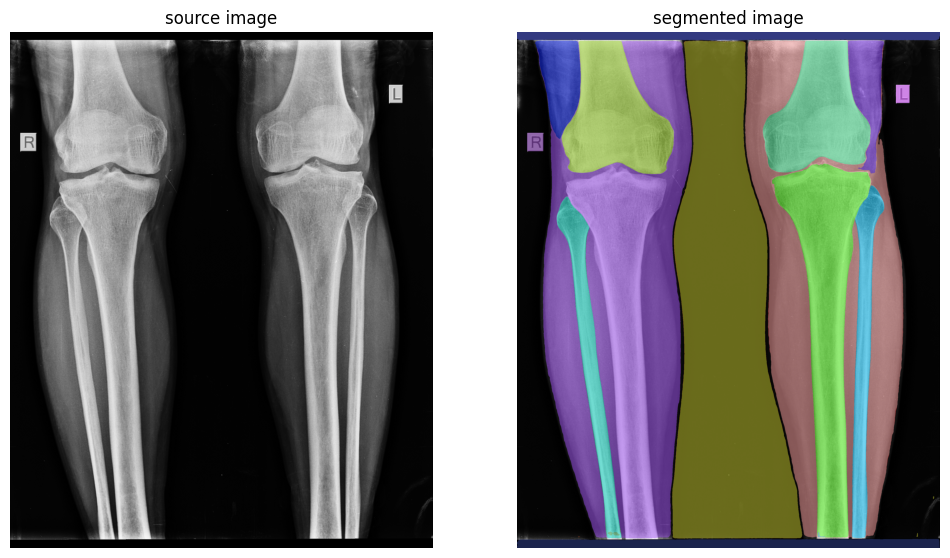

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

19

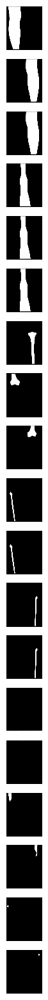

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(19, int(len(masks) / 19)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG84 = image * ROI
cv2.imwrite(save_path + "84.jpeg", SEG84)

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG84 = image * ROI
cv2.imwrite(save_path + "84.jpeg", SEG84)

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG85 = image * ROI
cv2.imwrite(save_path + "85.jpeg", SEG85)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS21.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


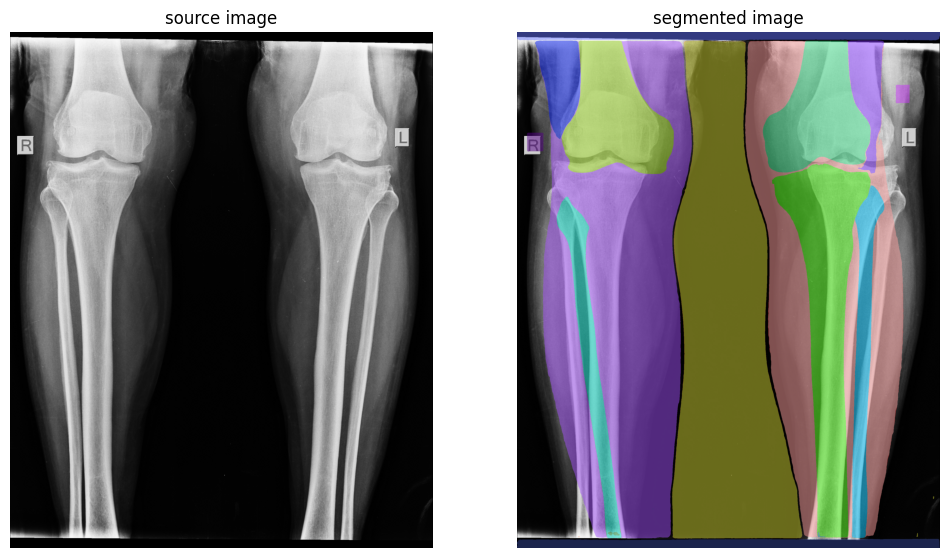

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

24

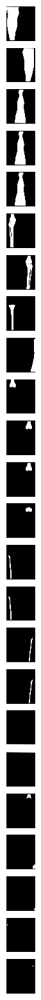

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(24, int(len(masks) / 24)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG86 = image * ROI
cv2.imwrite(save_path + "86.jpeg", SEG86)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG87 = image * ROI
cv2.imwrite(save_path + "87.jpeg", SEG87)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG88 = image * ROI
cv2.imwrite(save_path + "88.jpeg", SEG88)

True

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG89 = image * ROI
cv2.imwrite(save_path + "89.jpeg", SEG89)

True

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG89 = image * ROI
cv2.imwrite(save_path + "89.jpeg", SEG89)

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG90 = image * ROI
cv2.imwrite(save_path + "90.jpeg", SEG90)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG90 = image * ROI
cv2.imwrite(save_path + "90.jpeg", SEG90)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS22.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


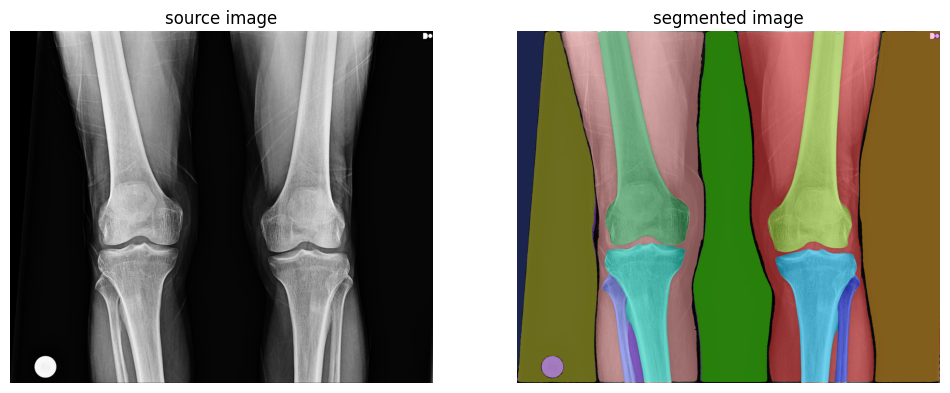

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

20

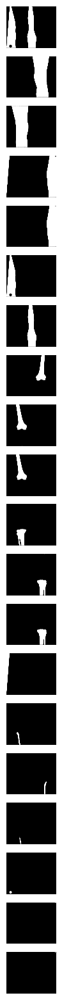

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(20, int(len(masks) / 20)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG91 = image * ROI
cv2.imwrite(save_path + "91.jpeg", SEG91)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG92 = image * ROI
cv2.imwrite(save_path + "92.jpeg", SEG92)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG93 = image * ROI
cv2.imwrite(save_path + "93.jpeg", SEG93)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG94 = image * ROI
cv2.imwrite(save_path + "94.jpeg", SEG94)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG95 = image * ROI
cv2.imwrite(save_path + "95.jpeg", SEG95)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG96 = image * ROI
cv2.imwrite(save_path + "96.jpeg", SEG96)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG93 = image * ROI
cv2.imwrite(save_path + "93.jpeg", SEG93)

True

In [ ]:
im = masks[13]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG94 = image * ROI
cv2.imwrite(save_path + "94.jpeg", SEG94)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS23.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


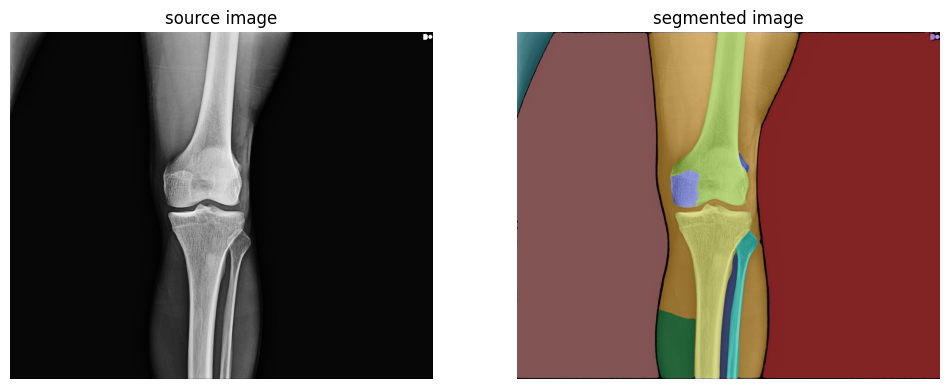

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

18

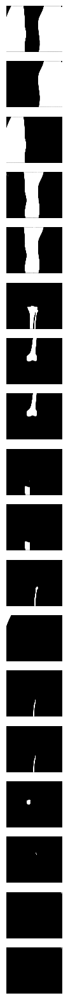

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(18, int(len(masks) / 18)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG95 = image * ROI
cv2.imwrite(save_path + "95.jpeg", SEG95)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG96 = image * ROI
cv2.imwrite(save_path + "96.jpeg", SEG96)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG97 = image * ROI
cv2.imwrite(save_path + "97.jpeg", SEG97)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS24.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


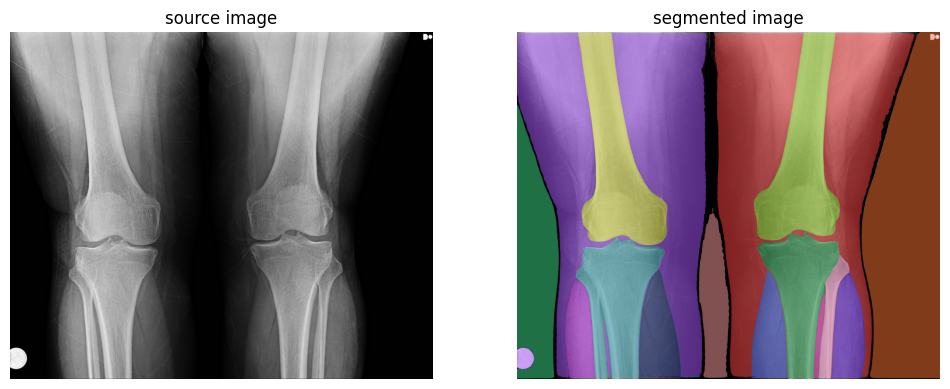

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

25

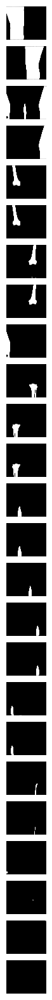

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(25, int(len(masks) / 25)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG98 = image * ROI
cv2.imwrite(save_path + "98.jpeg", SEG98)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG99 = image * ROI
cv2.imwrite(save_path + "99.jpeg", SEG99)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG100 = image * ROI
cv2.imwrite(save_path + "100.jpeg", SEG100)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG101 = image * ROI
cv2.imwrite(save_path + "101.jpeg", SEG101)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG102 = image * ROI
cv2.imwrite(save_path + "102.jpeg", SEG102)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG103 = image * ROI
cv2.imwrite(save_path + "103.jpeg", SEG103)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG104 = image * ROI
cv2.imwrite(save_path + "104.jpeg", SEG104)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS25.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


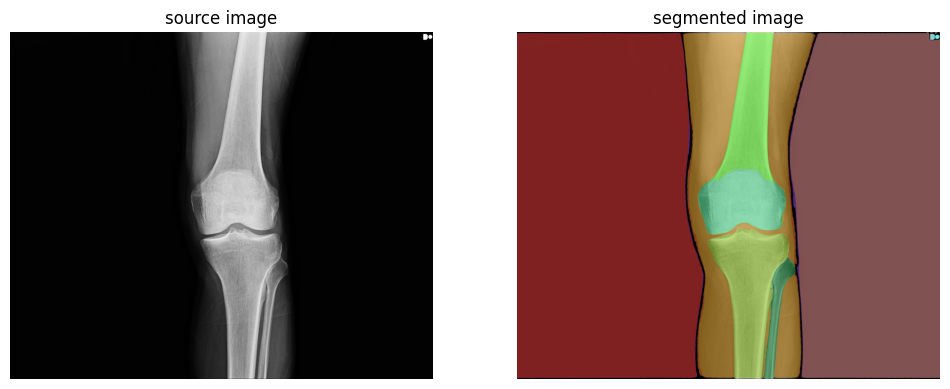

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

12

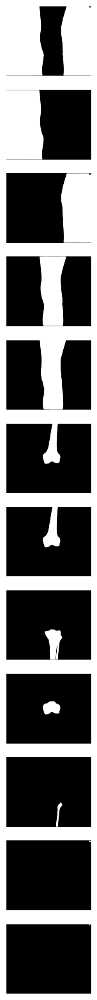

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(12, int(len(masks) / 12)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
save_path = "/content/drive/My Drive/ROI2/Osteoporosis/"

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG105 = image * ROI
cv2.imwrite(save_path + "105.jpeg", SEG105)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG106 = image * ROI
cv2.imwrite(save_path + "106.jpeg", SEG106)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG107 = image * ROI
cv2.imwrite(save_path + "107.jpeg", SEG107)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG108 = image * ROI
cv2.imwrite(save_path + "108.jpeg", SEG108)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS26.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


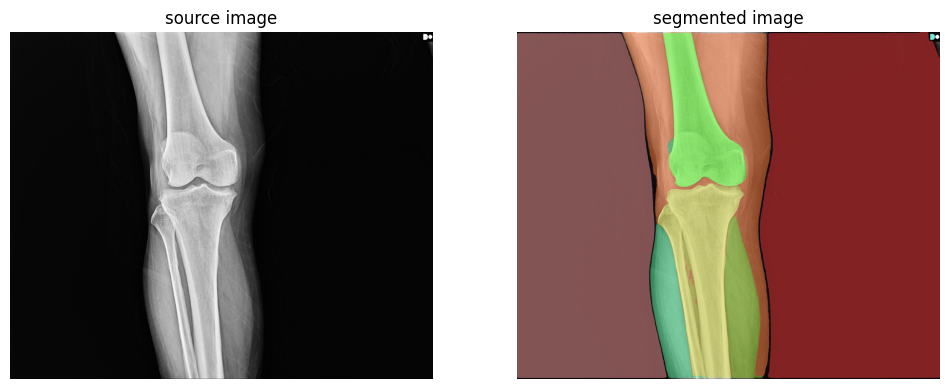

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

11

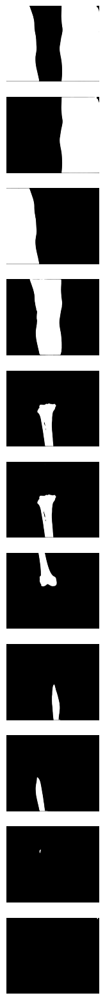

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(11, int(len(masks) / 11)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[4]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG109 = image * ROI
cv2.imwrite(save_path + "109.jpeg", SEG109)

True

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG110 = image * ROI
cv2.imwrite(save_path + "110.jpeg", SEG110)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG111 = image * ROI
cv2.imwrite(save_path + "111.jpeg", SEG111)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS27.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


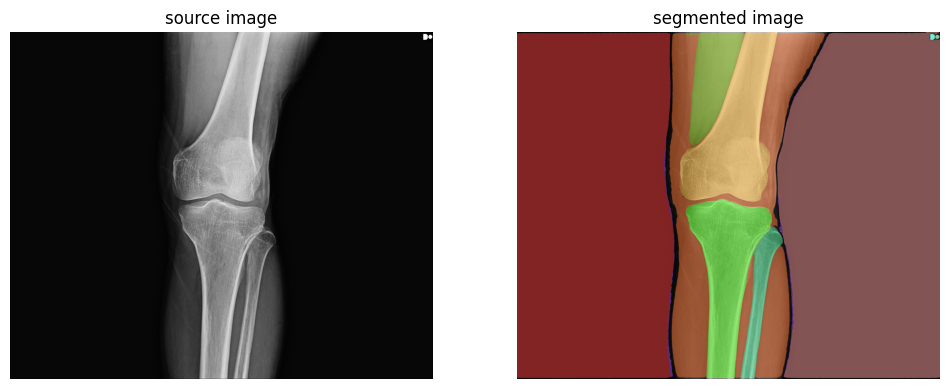

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

11

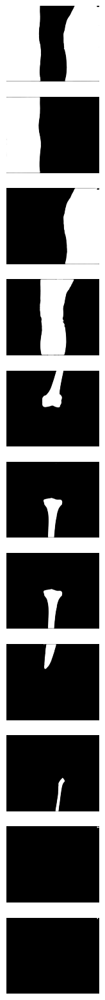

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(11, int(len(masks) / 11)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[4]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG112 = image * ROI
cv2.imwrite(save_path + "112.jpeg", SEG112)

True

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG113 = image * ROI
cv2.imwrite(save_path + "113.jpeg", SEG113)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG114 = image * ROI
cv2.imwrite(save_path + "114.jpeg", SEG114)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS28.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


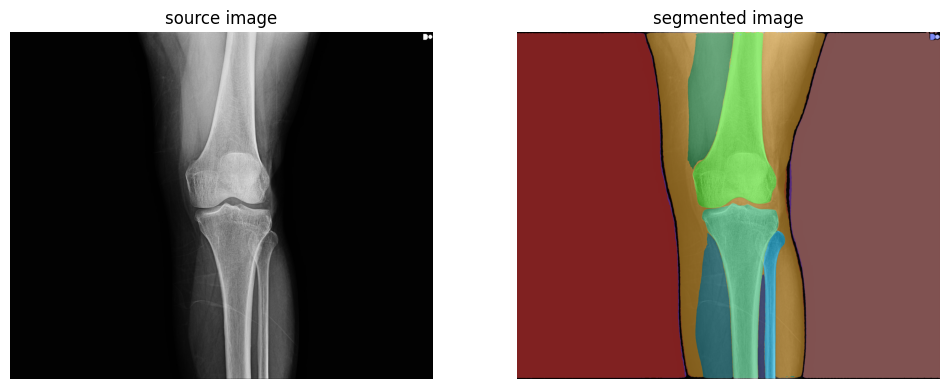

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

16

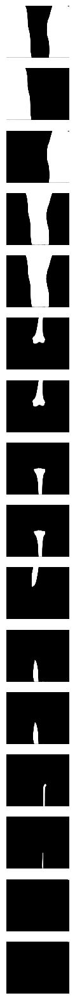

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(16, int(len(masks) / 16)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG115 = image * ROI
cv2.imwrite(save_path + "115.jpeg", SEG115)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG116 = image * ROI
cv2.imwrite(save_path + "116.jpeg", SEG116)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG117 = image * ROI
cv2.imwrite(save_path + "117.jpeg", SEG117)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS29.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


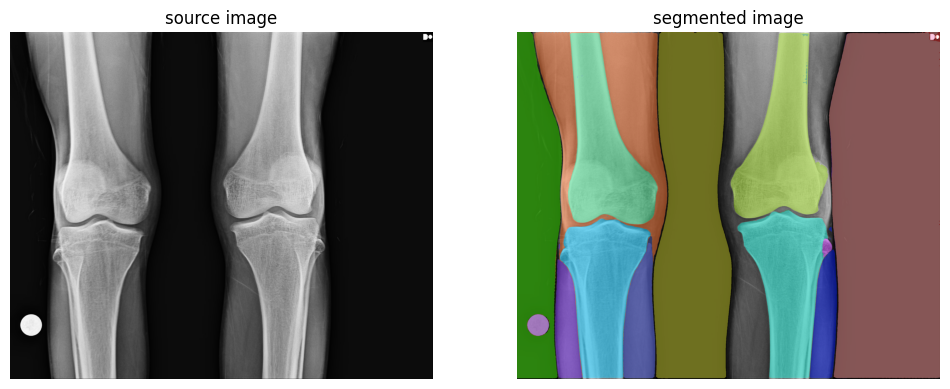

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

20

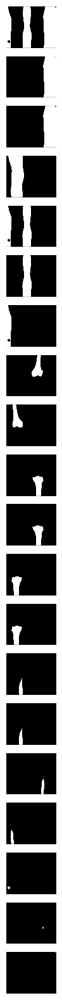

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(20, int(len(masks) / 20)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG118 = image * ROI
cv2.imwrite(save_path + "118.jpeg", SEG118)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG119 = image * ROI
cv2.imwrite(save_path + "119.jpeg", SEG119)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG120 = image * ROI
cv2.imwrite(save_path + "120.jpeg", SEG120)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG121 = image * ROI
cv2.imwrite(save_path + "121.jpeg", SEG121)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/osteoporosis/OS30.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


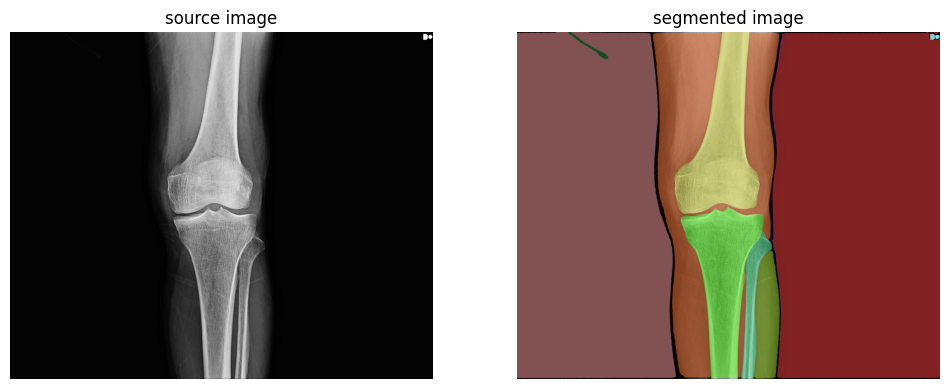

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

12

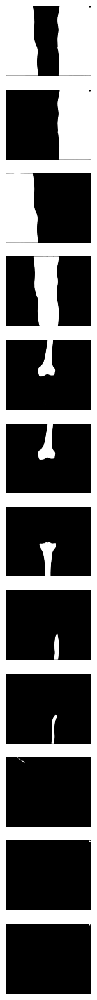

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(12, int(len(masks) / 12)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[4]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG122 = image * ROI
cv2.imwrite(save_path + "122.jpeg", SEG122)

True

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG123 = image * ROI
cv2.imwrite(save_path + "123.jpeg", SEG123)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG124 = image * ROI
cv2.imwrite(save_path + "124.jpeg", SEG124)

True

### Deriving Normal ROI

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N1.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


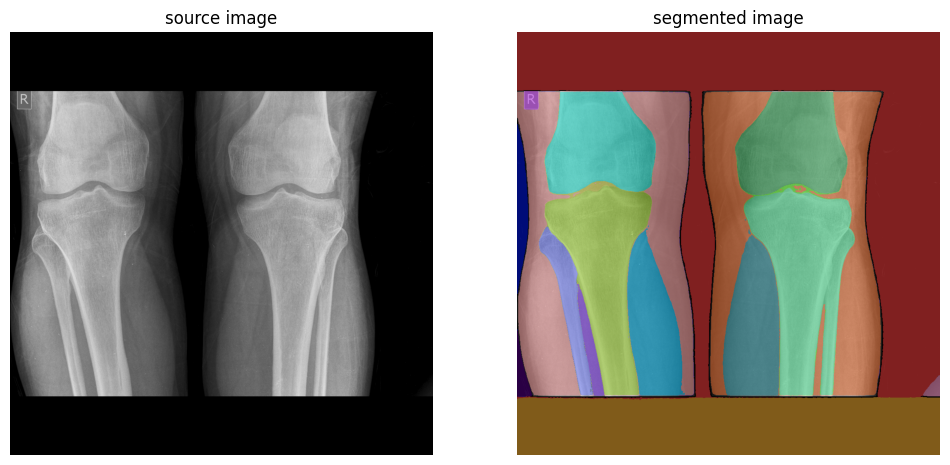

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

20

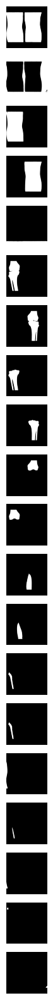

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(20, int(len(masks) / 20)),
    size=(20, 20)
)

In [ ]:
save_path = "/content/drive/My Drive/ROI2/Normal/"

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG1 = image * ROI
cv2.imwrite(save_path + "1.jpeg", SEG1)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG3 = image * ROI
cv2.imwrite(save_path + "3.jpeg", SEG3)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG4 = image * ROI
cv2.imwrite(save_path + "4.jpeg", SEG6)

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG5 = image * ROI
cv2.imwrite(save_path + "5.jpeg", SEG5)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG6 = image * ROI
cv2.imwrite(save_path + "6.jpeg", SEG6)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG7 = image * ROI
cv2.imwrite(save_path + "7.jpeg", SEG7)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N3.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


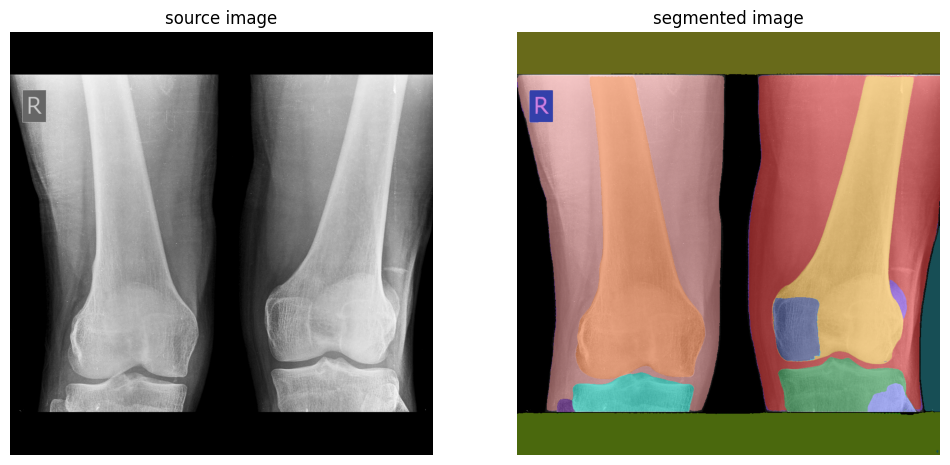

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

19

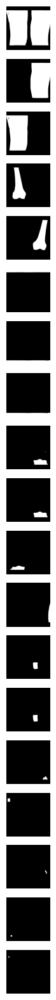

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(19, int(len(masks) / 19)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[4]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG7 = image * ROI
cv2.imwrite(save_path + "7.jpeg", SEG7)

True

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG8 = image * ROI
cv2.imwrite(save_path + "8.jpeg", SEG8)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N4.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


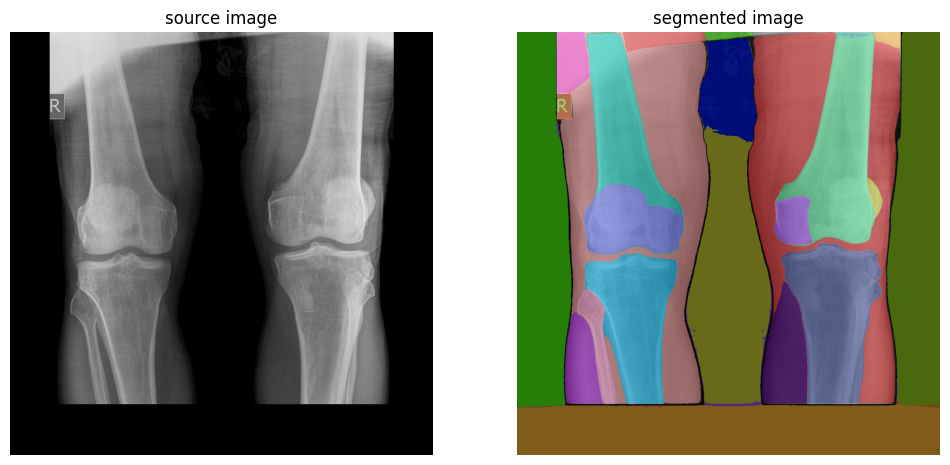

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

29

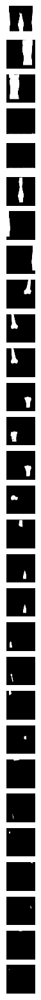

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(29, int(len(masks) / 29)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG9 = image * ROI
cv2.imwrite(save_path + "9.jpeg", SEG9)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG10 = image * ROI
cv2.imwrite(save_path + "10.jpeg", SEG10)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG11 = image * ROI
cv2.imwrite(save_path + "11.jpeg", SEG11)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG12 = image * ROI
cv2.imwrite(save_path + "12.jpeg", SEG12)

True

In [ ]:
im = masks[13]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG13 = image * ROI
cv2.imwrite(save_path + "13.jpeg", SEG13)

True

In [ ]:
im = masks[14]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG14 = image * ROI
cv2.imwrite(save_path + "14.jpeg", SEG14)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N5.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


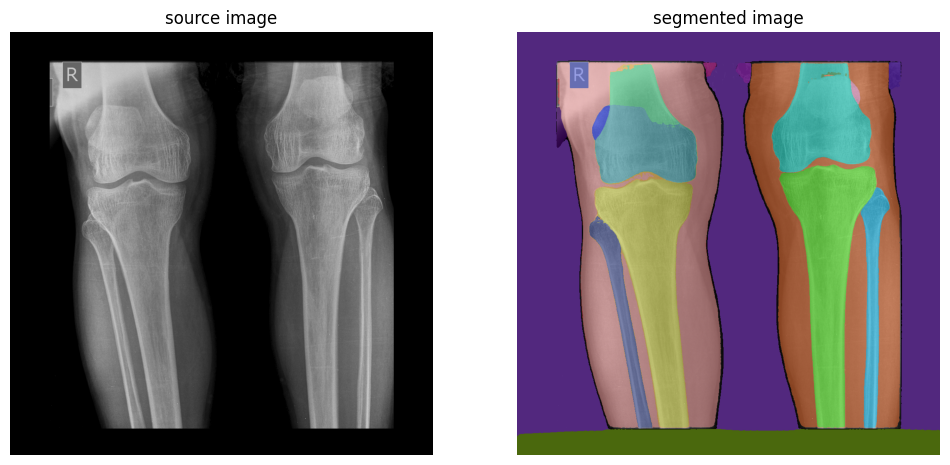

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

21

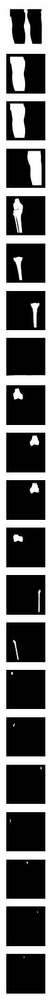

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(21, int(len(masks) / 21)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG15 = image * ROI
cv2.imwrite(save_path + "15.jpeg", SEG15)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG16 = image * ROI
cv2.imwrite(save_path + "16.jpeg", SEG16)

True

In [ ]:
im = masks[4]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG17 = image * ROI
cv2.imwrite(save_path + "17.jpeg", SEG17)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG18 = image * ROI
cv2.imwrite(save_path + "18.jpeg", SEG18)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG19 = image * ROI
cv2.imwrite(save_path + "19.jpeg", SEG19)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG20 = image * ROI
cv2.imwrite(save_path + "2.jpeg", SEG20)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG21 = image * ROI
cv2.imwrite(save_path + "21.jpeg", SEG21)

True

In [ ]:
im = masks[13]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG22 = image * ROI
cv2.imwrite(save_path + "22.jpeg", SEG22)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N6.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


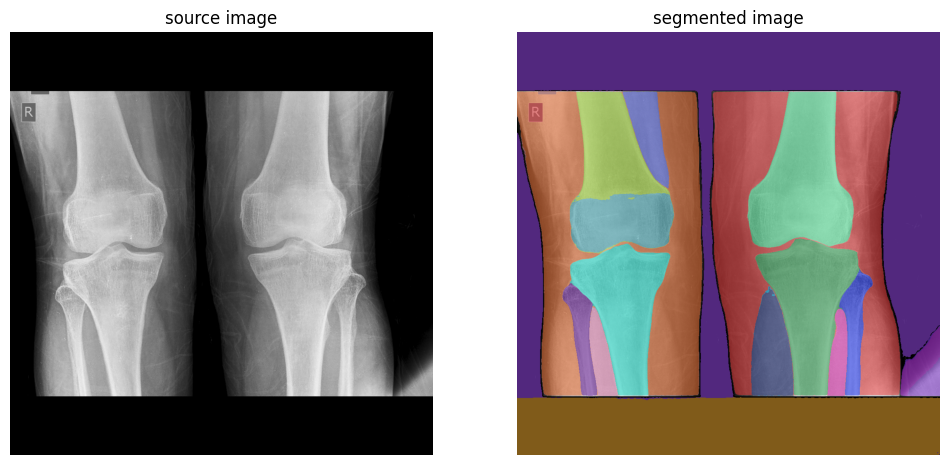

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

24

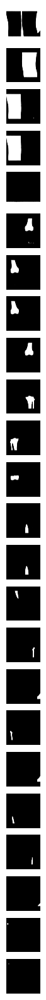

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(24, int(len(masks) / 24)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG23 = image * ROI
cv2.imwrite(save_path + "23.jpeg", SEG23)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG24 = image * ROI
cv2.imwrite(save_path + "24.jpeg", SEG24)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG25 = image * ROI
cv2.imwrite(save_path + "25.jpeg", SEG25)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG26 = image * ROI
cv2.imwrite(save_path + "26.jpeg", SEG26)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG27 = image * ROI
cv2.imwrite(save_path + "27.jpeg", SEG27)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG28 = image * ROI
cv2.imwrite(save_path + "28.jpeg", SEG28)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG29 = image * ROI
cv2.imwrite(save_path + "29.jpeg", SEG29)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG30 = image * ROI
cv2.imwrite(save_path + "30.jpeg", SEG30)

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N8.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


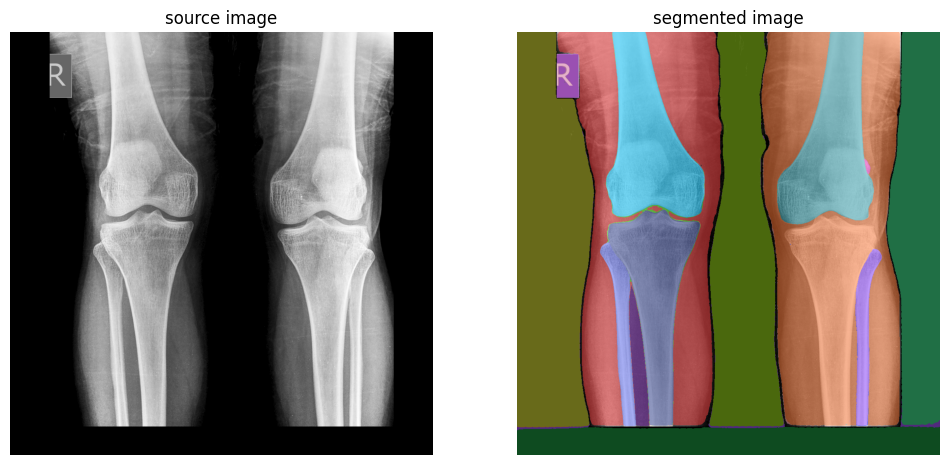

In [ ]:
import supervision as sv
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

21

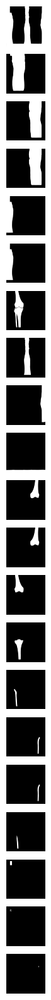

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(21, int(len(masks) / 21)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG31 = image * ROI
cv2.imwrite(save_path + "31.jpeg", SEG31)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG33 = image * ROI
cv2.imwrite(save_path + "33.jpeg", SEG33)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG34 = image * ROI
cv2.imwrite(save_path + "34.jpeg", SEG34)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG35 = image * ROI
cv2.imwrite(save_path + "35.jpeg", SEG35)

True

In [ ]:
im = masks[13]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG36 = image * ROI
cv2.imwrite(save_path + "36.jpeg", SEG36)

True

In [ ]:
im = masks[15]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG37 = image * ROI
cv2.imwrite(save_path + "37.jpeg", SEG37)

True

In [ ]:
im = masks[16]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG38 = image * ROI
cv2.imwrite(save_path + "38.jpeg", SEG38)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N9.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


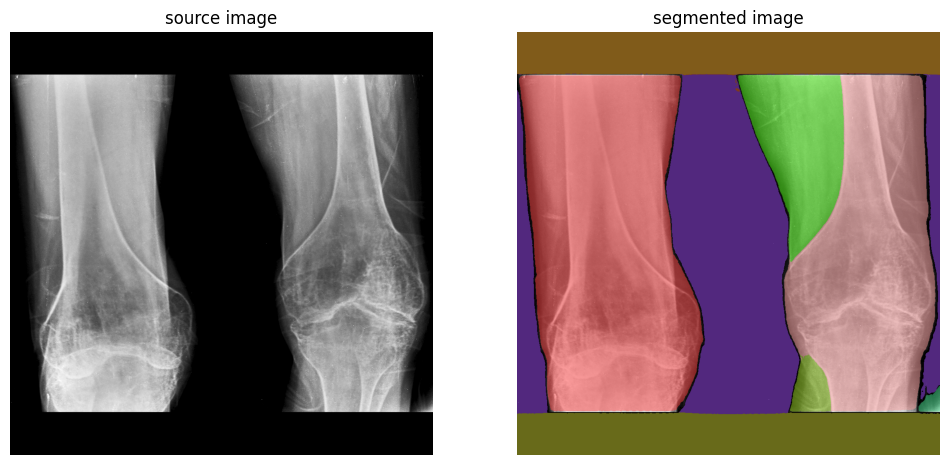

In [ ]:
import supervision as sv
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

9

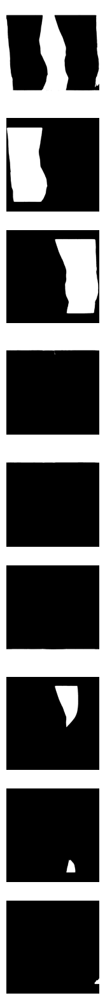

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(9, int(len(masks) / 9)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[1]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG39 = image * ROI
cv2.imwrite(save_path + "39.jpeg", SEG39)

True

In [ ]:
im = masks[2]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG40 = image * ROI
cv2.imwrite(save_path + "40.jpeg", SEG40)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N10.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


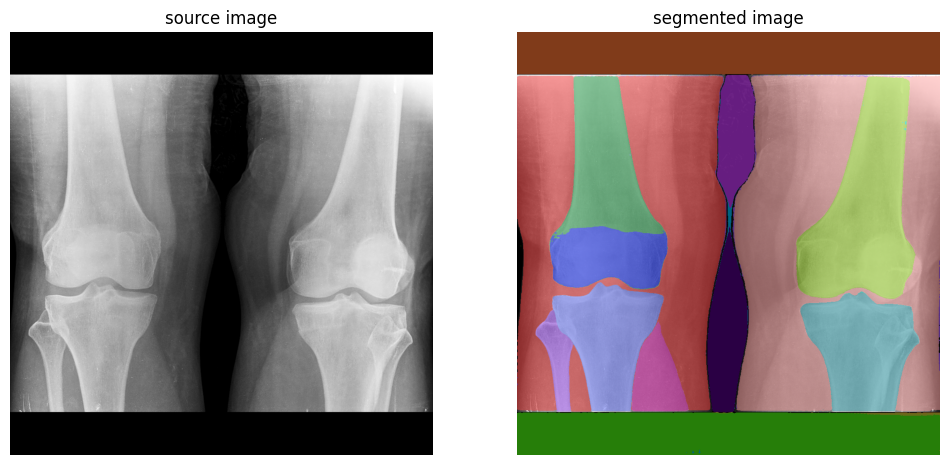

In [ ]:
import supervision as sv
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

24

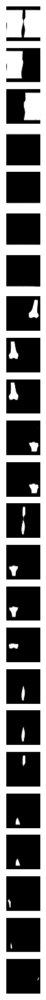

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(24, int(len(masks) / 24)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG44 = image * ROI
cv2.imwrite(save_path + "44.jpeg", SEG44)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG45 = image * ROI
cv2.imwrite(save_path + "45.jpeg", SEG45)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG46 = image * ROI
cv2.imwrite(save_path + "46.jpeg", SEG46)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG47 = image * ROI
cv2.imwrite(save_path + "47.jpeg", SEG47)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG48 = image * ROI
cv2.imwrite(save_path + "48.jpeg", SEG48)

True

In [ ]:
im = masks[13]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG49 = image * ROI
cv2.imwrite(save_path + "49.jpeg", SEG49)

True

In [ ]:
im = masks[14]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG50 = image * ROI
cv2.imwrite(save_path + "50.jpeg", SEG50)

True

In [ ]:
im = masks[15]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG51 = image * ROI
cv2.imwrite(save_path + "51.jpeg", SEG51)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N11.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


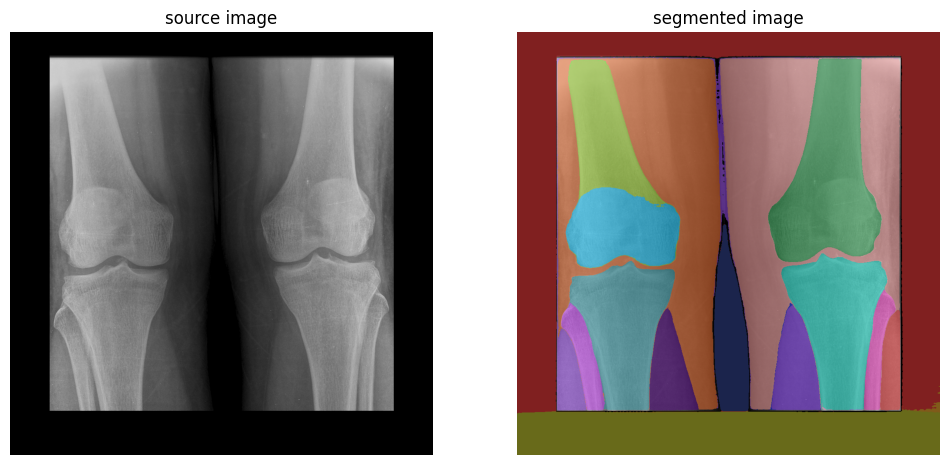

In [ ]:
import supervision as sv
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

23

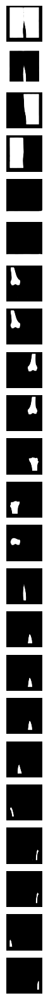

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(23, int(len(masks) / 23)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG52 = image * ROI
cv2.imwrite(save_path + "52.jpeg", SEG52)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG53 = image * ROI
cv2.imwrite(save_path + "53.jpeg", SEG53)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG54 = image * ROI
cv2.imwrite(save_path + "54.jpeg", SEG54)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG55 = image * ROI
cv2.imwrite(save_path + "55.jpeg", SEG55)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG56 = image * ROI
cv2.imwrite(save_path + "56.jpeg", SEG56)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG57 = image * ROI
cv2.imwrite(save_path + "57.jpeg", SEG57)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG58 = image * ROI
cv2.imwrite(save_path + "58.jpeg", SEG58)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N12.JPEG"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


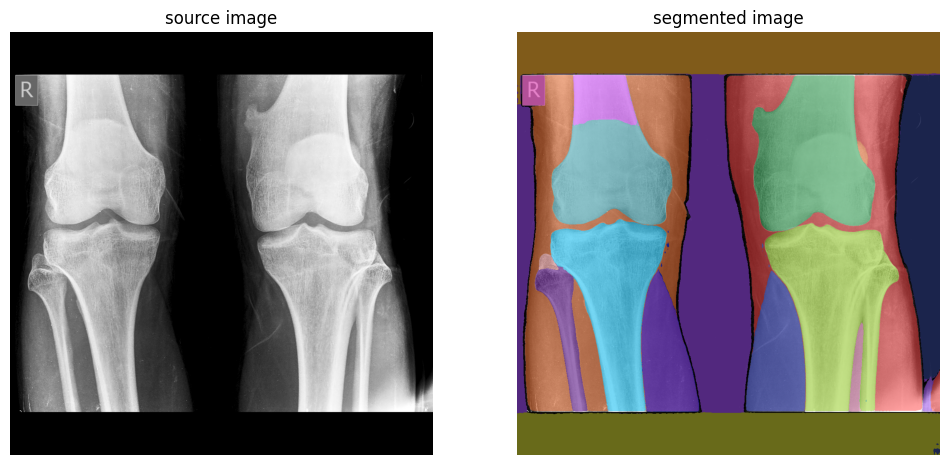

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

25

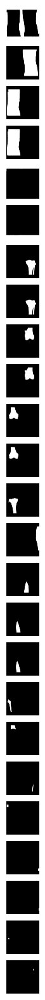

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(25, int(len(masks) / 25)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG59 = image * ROI
cv2.imwrite(save_path + "59.jpeg", SEG59)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG60 = image * ROI
cv2.imwrite(save_path + "60.jpeg", SEG60)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG61 = image * ROI
cv2.imwrite(save_path + "61.jpeg", SEG61)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG62 = image * ROI
cv2.imwrite(save_path + "62.jpeg", SEG62)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG64 = image * ROI
cv2.imwrite(save_path + "64.jpeg", SEG64)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N13.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


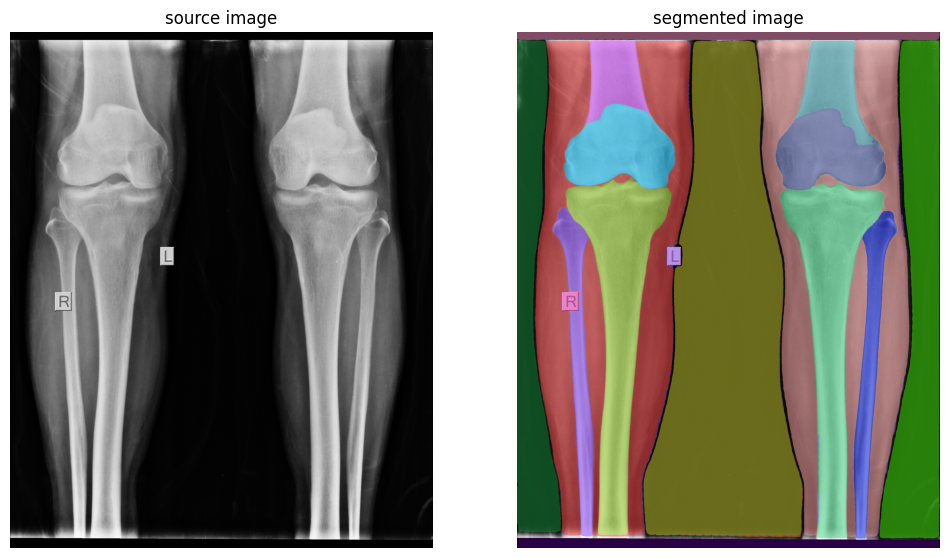

In [ ]:
import supervision as sv
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

22

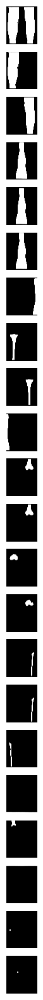

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(22, int(len(masks) / 22)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG65 = image * ROI
cv2.imwrite(save_path + "65.jpeg", SEG65)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG66 = image * ROI
cv2.imwrite(save_path + "66.jpeg", SEG66)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG67 = image * ROI
cv2.imwrite(save_path + "67.jpeg", SEG67)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG68 = image * ROI
cv2.imwrite(save_path + "68.jpeg", SEG68)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG69 = image * ROI
cv2.imwrite(save_path + "69.jpeg", SEG69)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N14.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


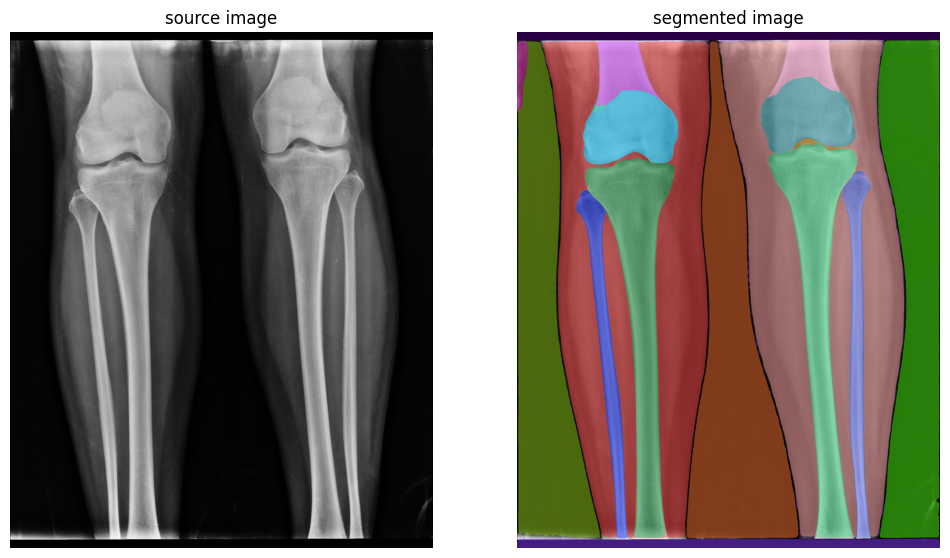

In [ ]:
import supervision as sv
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

21

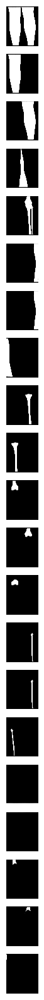

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(21, int(len(masks) / 21)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[4]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG70 = image * ROI
cv2.imwrite(save_path + "70.jpeg", SEG70)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG71 = image * ROI
cv2.imwrite(save_path + "71.jpeg", SEG71)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG72 = image * ROI
cv2.imwrite(save_path + "72.jpeg", SEG72)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG73 = image * ROI
cv2.imwrite(save_path + "73.jpeg", SEG73)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG74 = image * ROI
cv2.imwrite(save_path + "74.jpeg", SEG74)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG75 = image * ROI
cv2.imwrite(save_path + "75.jpeg", SEG75)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG76 = image * ROI
cv2.imwrite(save_path + "76.jpeg", SEG76)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N15.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


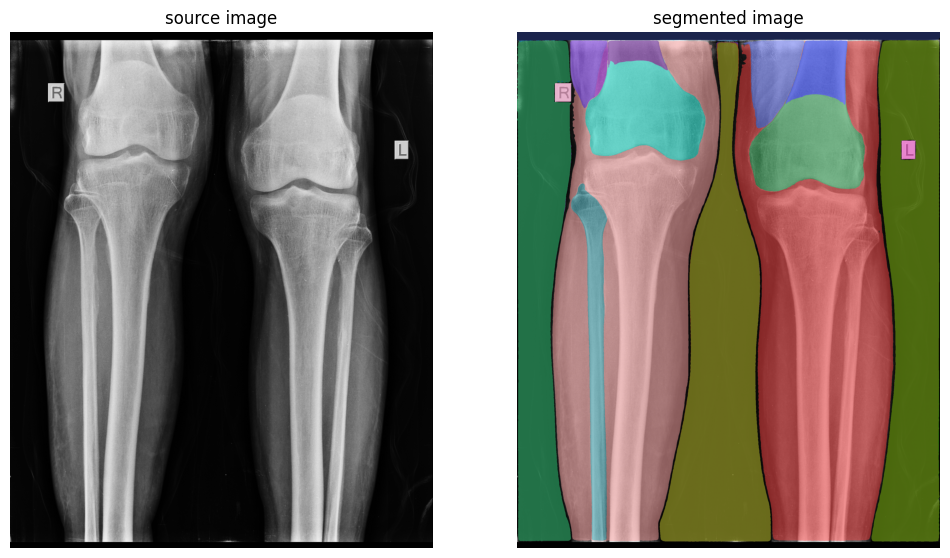

In [ ]:
import supervision as sv
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

21

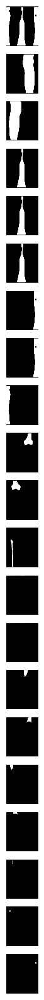

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(21, int(len(masks) / 21)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG77 = image * ROI
cv2.imwrite(save_path + "77.jpeg", SEG77)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N17.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


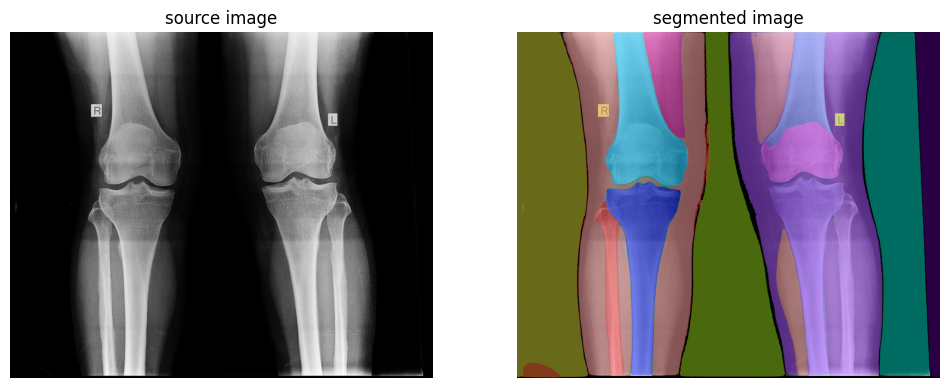

In [ ]:
import supervision as sv
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

27

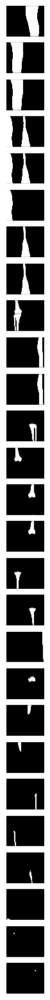

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(27, int(len(masks) / 27)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG79 = image * ROI
cv2.imwrite(save_path + "79.jpeg", SEG79)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG80 = image * ROI
cv2.imwrite(save_path + "80.jpeg", SEG80)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG81 = image * ROI
cv2.imwrite(save_path + "81.jpeg", SEG81)

True

In [ ]:
im = masks[13]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG82 = image * ROI
cv2.imwrite(save_path + "82.jpeg", SEG82)

True

In [ ]:
im = masks[14]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG83 = image * ROI
cv2.imwrite(save_path + "83.jpeg", SEG83)

True

In [ ]:
im = masks[15]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG84 = image * ROI
cv2.imwrite(save_path + "84.jpeg", SEG84)

True

In [ ]:
im = masks[16]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG85 = image * ROI
cv2.imwrite(save_path + "85.jpeg", SEG85)

True

In [ ]:
im = masks[17]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG86 = image * ROI
cv2.imwrite(save_path + "86.jpeg", SEG86)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N18.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


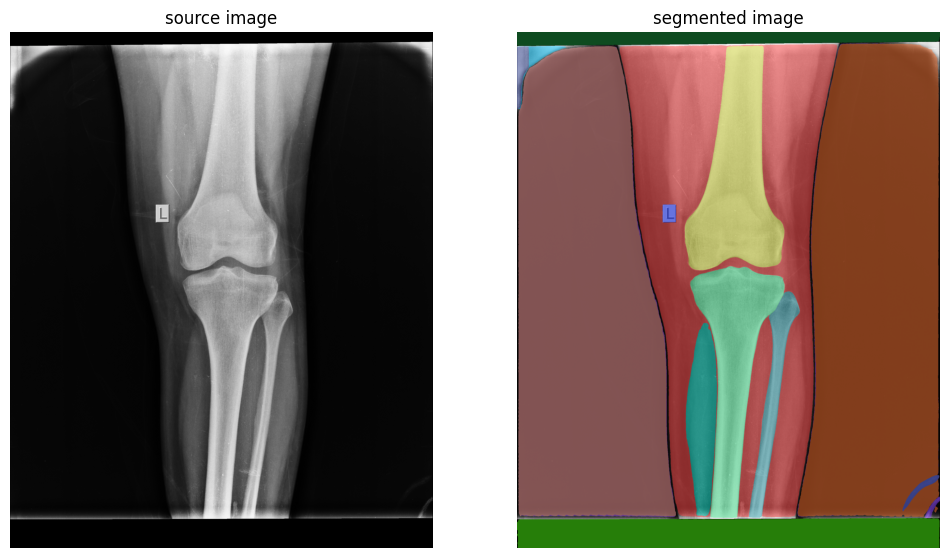

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

17

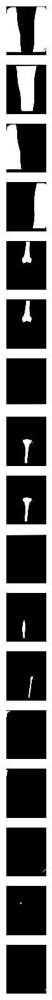

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(17, int(len(masks) / 17)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[4]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG87 = image * ROI
cv2.imwrite(save_path + "87.jpeg", SEG87)

True

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG88 = image * ROI
cv2.imwrite(save_path + "88.jpeg", SEG88)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG89 = image * ROI
cv2.imwrite(save_path + "89.jpeg", SEG89)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG90 = image * ROI
cv2.imwrite(save_path + "90.jpeg", SEG90)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N19.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


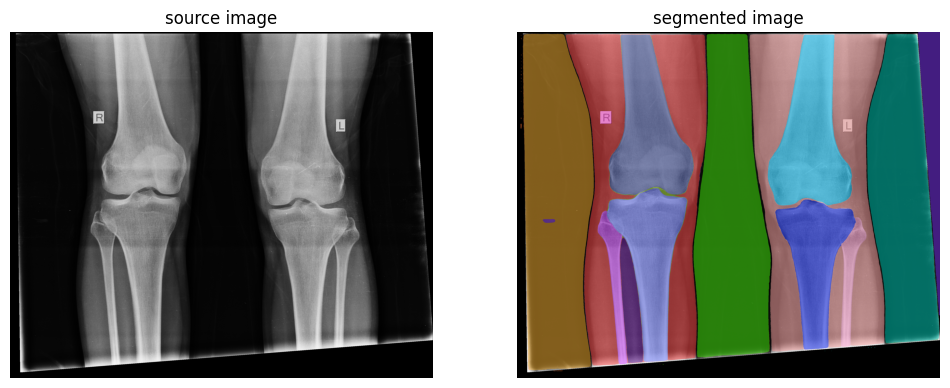

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

22

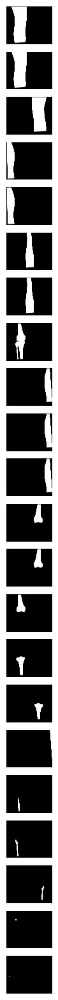

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(22, int(len(masks) / 22)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG91 = image * ROI
cv2.imwrite(save_path + "91.jpeg", SEG91)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG92 = image * ROI
cv2.imwrite(save_path + "92.jpeg", SEG92)

True

In [ ]:
im = masks[12]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG93 = image * ROI
cv2.imwrite(save_path + "93.jpeg", SEG93)

True

In [ ]:
im = masks[13]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG94 = image * ROI
cv2.imwrite(save_path + "94.jpeg", SEG94)

True

In [ ]:
im = masks[14]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG95 = image * ROI
cv2.imwrite(save_path + "95.jpeg", SEG95)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N20.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


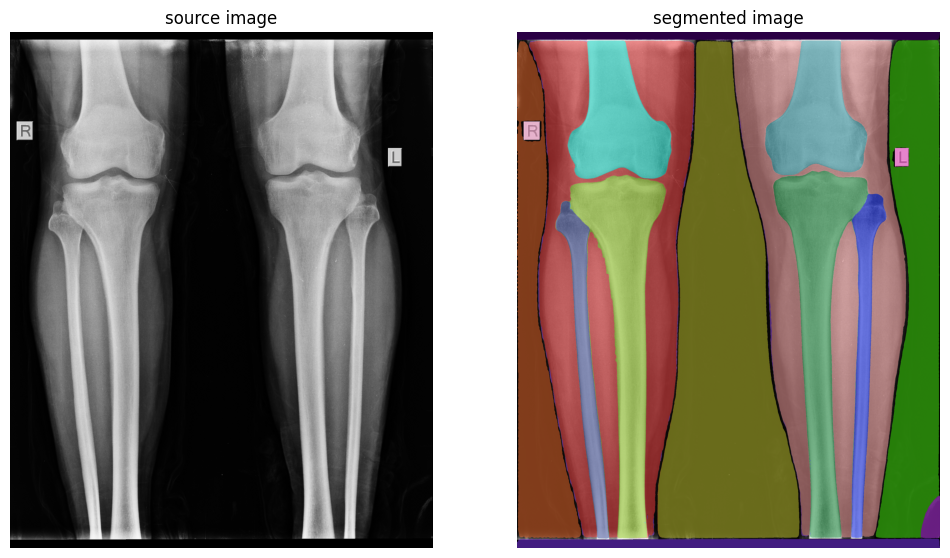

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

21

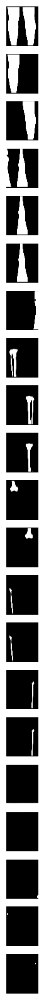

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(21, int(len(masks) / 21)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG96 = image * ROI
cv2.imwrite(save_path + "96.jpeg", SEG96)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG97 = image * ROI
cv2.imwrite(save_path + "97.jpeg", SEG97)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG98 = image * ROI
cv2.imwrite(save_path + "98.jpeg", SEG98)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG99 = image * ROI
cv2.imwrite(save_path + "99.jpeg", SEG99)

True

In [ ]:
im = masks[11]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG100 = image * ROI
cv2.imwrite(save_path + "100.jpeg", SEG100)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N21.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


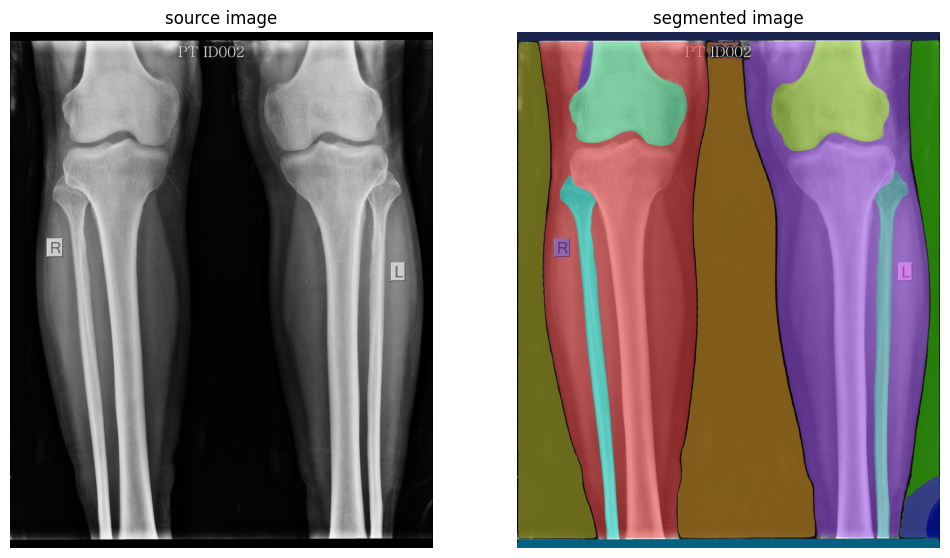

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

19

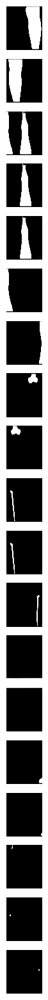

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(19, int(len(masks) / 19)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG101 = image * ROI
cv2.imwrite(save_path + "101.jpeg", SEG101)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG102 = image * ROI
cv2.imwrite(save_path + "102.jpeg", SEG102)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N22.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


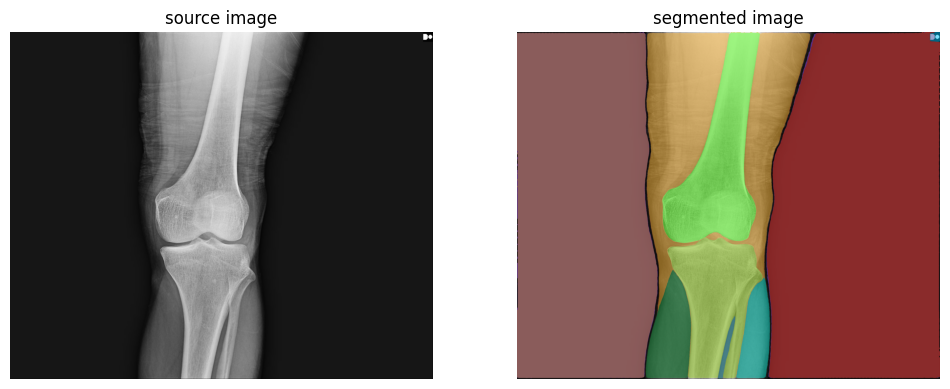

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

14

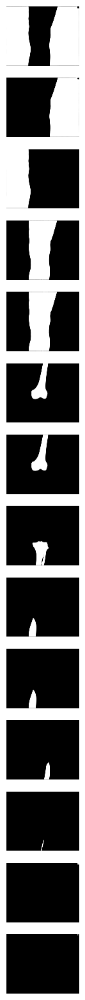

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(14, int(len(masks) / 14)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG103 = image * ROI
cv2.imwrite(save_path + "103.jpeg", SEG103)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG104 = image * ROI
cv2.imwrite(save_path + "104.jpeg", SEG104)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG105 = image * ROI
cv2.imwrite(save_path + "105.jpeg", SEG105)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N23.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


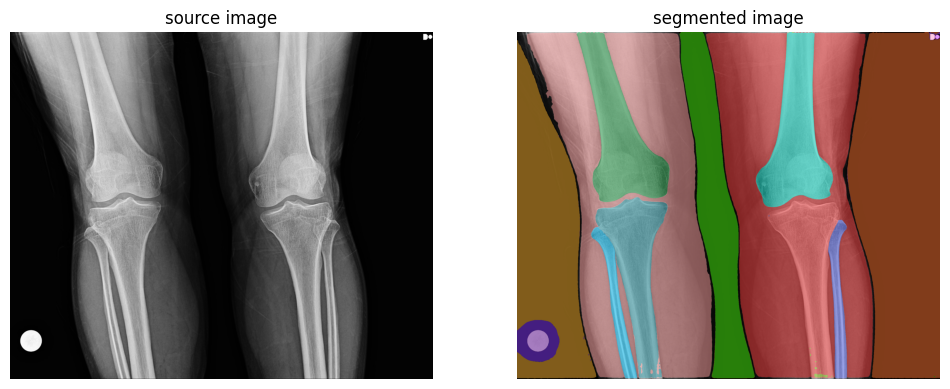

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

20

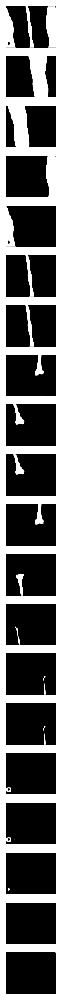

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(20, int(len(masks) / 20)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG106 = image * ROI
cv2.imwrite(save_path + "106.jpeg", SEG106)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG106 = image * ROI
cv2.imwrite(save_path + "106.jpeg", SEG106)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG106 = image * ROI
cv2.imwrite(save_path + "106.jpeg", SEG106)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG107 = image * ROI
cv2.imwrite(save_path + "107.jpeg", SEG107)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG106 = image * ROI
cv2.imwrite(save_path + "106.jpeg", SEG106)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N24.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


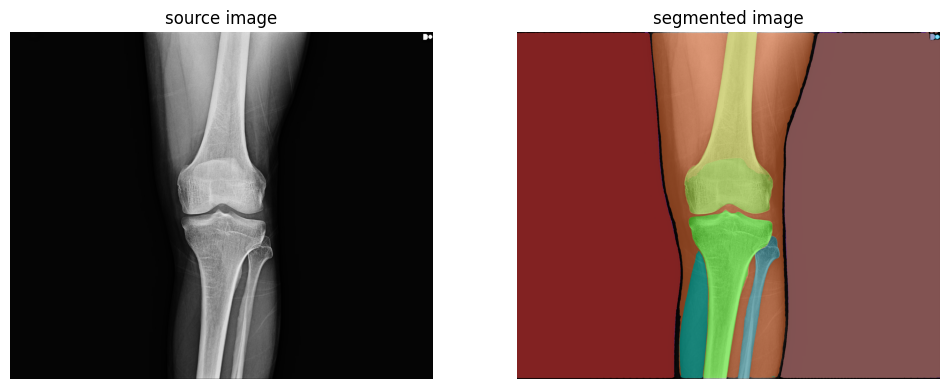

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

14

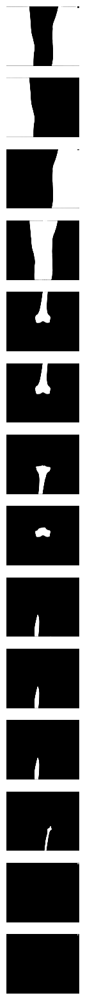

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(14, int(len(masks) / 14)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[4]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG107 = image * ROI
cv2.imwrite(save_path + "107.jpeg", SEG107)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG108 = image * ROI
cv2.imwrite(save_path + "108.jpeg", SEG108)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG109 = image * ROI
cv2.imwrite(save_path + "109.jpeg", SEG109)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG110 = image * ROI
cv2.imwrite(save_path + "110.jpeg", SEG110)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N25.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


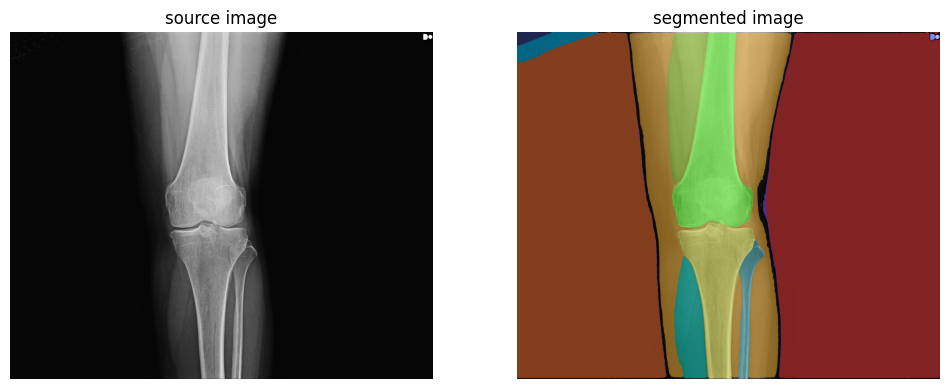

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

16

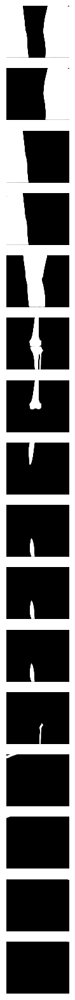

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(16, int(len(masks) / 16)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG111 = image * ROI
cv2.imwrite(save_path + "111.jpeg", SEG111)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG112 = image * ROI
cv2.imwrite(save_path + "112.jpeg", SEG112)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N26.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


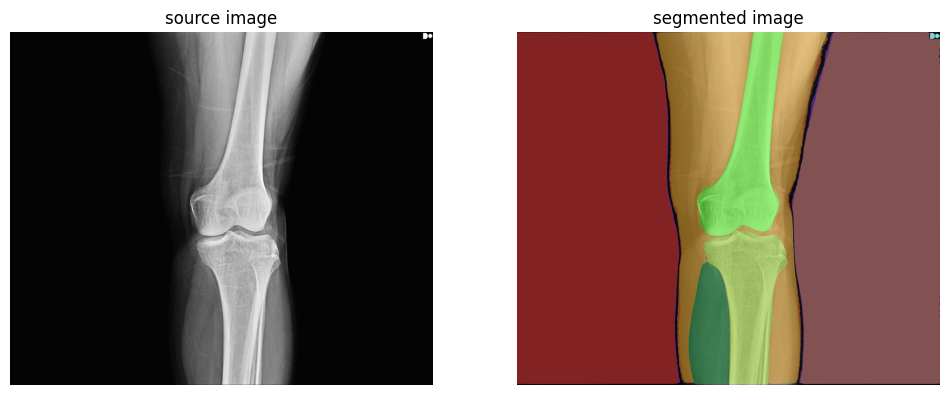

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

12

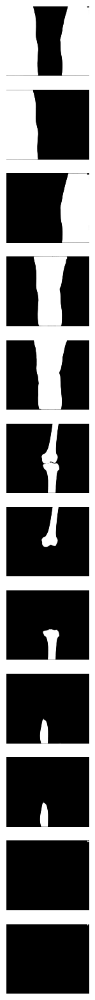

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(12, int(len(masks) / 12)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG113 = image * ROI
cv2.imwrite(save_path + "113.jpeg", SEG113)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG114 = image * ROI
cv2.imwrite(save_path + "114.jpeg", SEG114)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG115 = image * ROI
cv2.imwrite(save_path + "115.jpeg", SEG115)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N27.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


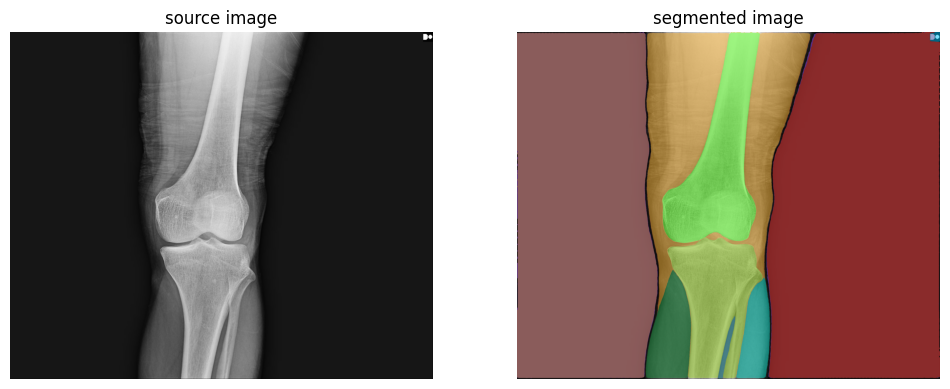

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

14

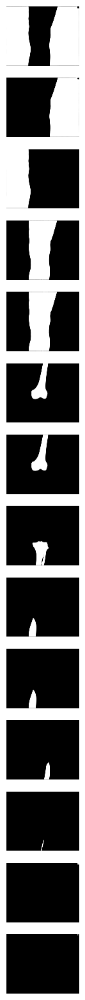

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(14, int(len(masks) / 14)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG116 = image * ROI
cv2.imwrite(save_path + "116.jpeg", SEG116)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG117 = image * ROI
cv2.imwrite(save_path + "117.jpeg", SEG117)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG118 = image * ROI
cv2.imwrite(save_path + "118.jpeg", SEG118)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N28.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


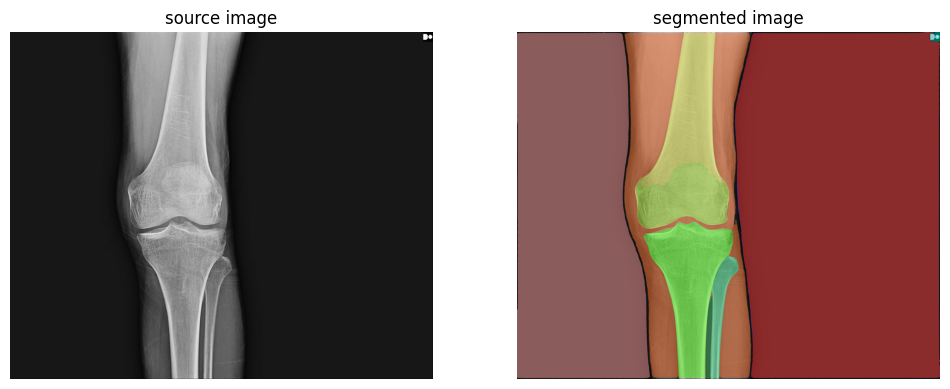

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

12

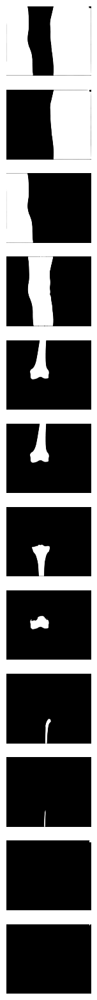

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(12, int(len(masks) / 12)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[4]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG119 = image * ROI
cv2.imwrite(save_path + "119.jpeg", SEG119)

True

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG120 = image * ROI
cv2.imwrite(save_path + "120.jpeg", SEG120)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG121 = image * ROI
cv2.imwrite(save_path + "121.jpeg", SEG121)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG122 = image * ROI
cv2.imwrite(save_path + "122.jpeg", SEG122)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N29.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


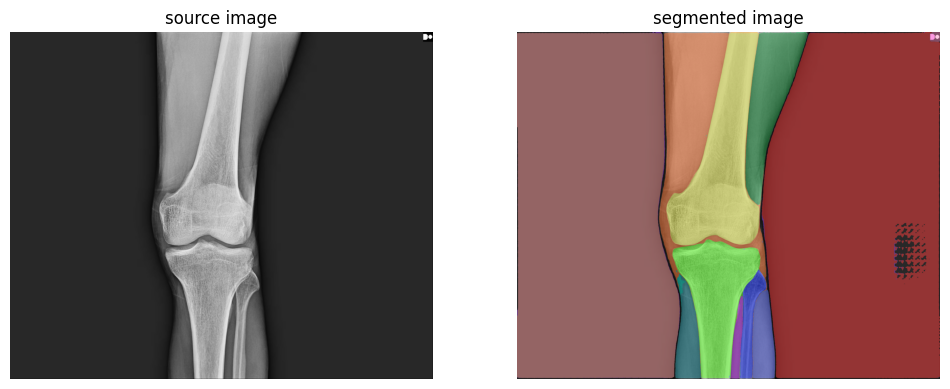

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

21

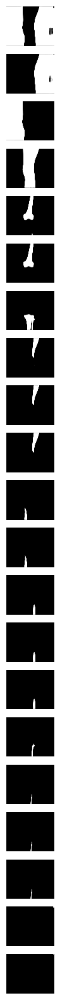

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(21, int(len(masks) / 21)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[4]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG123 = image * ROI
cv2.imwrite(save_path + "123.jpeg", SEG123)

True

In [ ]:
im = masks[5]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG123 = image * ROI
cv2.imwrite(save_path + "123.jpeg", SEG123)

True

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG124 = image * ROI
cv2.imwrite(save_path + "124.jpeg", SEG124)

True

In [ ]:
image_path = "drive/MyDrive/osteoporosis_knee_x-ray/normal/N30.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
sam_result = mask_generator.generate(image)
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


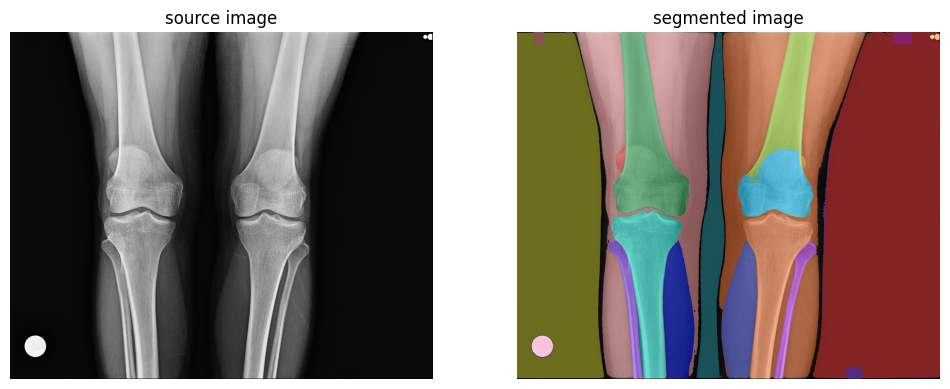

In [ ]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections.from_sam(sam_result=sam_result)

annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)

sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [ ]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]

len(masks)

27

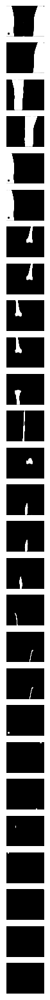

In [ ]:
sv.plot_images_grid(
    images=masks,
    grid_size=(27, int(len(masks) / 27)),
    size=(20, 20)
)

In [ ]:
masks = np.array(masks)
masks = (masks * 255).astype(np.uint8)

In [ ]:
im = masks[6]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG125 = image * ROI
cv2.imwrite(save_path + "125.jpeg", SEG125)

True

In [ ]:
im = masks[7]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG126 = image * ROI
cv2.imwrite(save_path + "126.jpeg", SEG126)

True

In [ ]:
im = masks[8]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG127 = image * ROI
cv2.imwrite(save_path + "127.jpeg", SEG127)

True

In [ ]:
im = masks[9]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG128 = image * ROI
cv2.imwrite(save_path + "128.jpeg", SEG128)

True

In [ ]:
im = masks[10]/255
im = im.astype(int)

ROI = np.copy(image)

ROI[im == 1] = 1
ROI[im != 1] = 0

SEG129 = image * ROI
cv2.imwrite(save_path + "129.jpeg", SEG129)

True